# E11
---

## Environment Setting
---

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import math
import numpy as np
import tensorflow as tf
import keras
import h5py
from pathlib import Path

import matplotlib.pyplot as plt
import cv2
import math
from tqdm import tqdm

%env SM_FRAMEWORK=tf.keras
import segmentation_models as sm
import albumentations as A

import seaborn
seaborn.set(style='white')
seaborn.set_context('paper')

from matplotlib import image

env: SM_FRAMEWORK=tf.keras
Segmentation Models: using `tf.keras` framework.


In [2]:
import tensorflow as tf
def init_gpu():
    gpus = tf.config.experimental.list_physical_devices('GPU')
    if gpus:
        try:
            # Currently, memory growth needs to be the same across GPUs
            for gpu in gpus:
                tf.config.experimental.set_memory_growth(gpu, True)
            logical_gpus = tf.config.experimental.list_logical_devices('GPU')

            print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs\n\n")
        except RuntimeError as e:
            # Memory growth must be set before GPUs have been initialized
            print(e, "\n\n")

init_gpu()

1 Physical GPUs, 1 Logical GPUs




In [3]:
workspace_path = '/home/aiffel-dj15/workspace/Hackerton/workspace/Model'

In [4]:
FILE_PATH = os.path.join(workspace_path, 'data/LV1_DATASET_R_5CHA.h5')

BASE_TARIN_DIR = "/train"
TRAIN_IMG_PATH = f'{Path(BASE_TARIN_DIR)}/img'
TRAIN_LABEL_PATH = f'{Path(BASE_TARIN_DIR)}/label'
TRAIN_SPLIT_DIR = f'{Path(BASE_TARIN_DIR)}/split'  
TRAIN_SPLIT_IMG_PATH = f'{Path(BASE_TARIN_DIR)}/split/img'           
TRAIN_SPLIT_LABEL_PATH = f'{Path(BASE_TARIN_DIR)}/split/label'                                                                                                                         

BASE_VAL_DIR = "/val"
VAL_IMG_PATH = f'{Path(BASE_VAL_DIR)}/img'
VAL_LABEL_PATH = f'{Path(BASE_VAL_DIR)}/label'
VAL_SPLIT_DIR = f'{Path(BASE_VAL_DIR)}/split'  
VAL_SPLIT_IMG_PATH = f'{Path(BASE_VAL_DIR)}/split/img'           
VAL_SPLIT_LABEL_PATH = f'{Path(BASE_VAL_DIR)}/split/label'  

BASE_TEST_DIR = "/test"
TEST_IMG_PATH = f'{Path(BASE_TEST_DIR)}/img'
TEST_LABEL_PATH = f'{Path(BASE_TEST_DIR)}/label'
TEST_SPLIT_DIR = f'{Path(BASE_TEST_DIR)}/split'  
TEST_SPLIT_IMG_PATH = f'{Path(BASE_TEST_DIR)}/split/img'           
TEST_SPLIT_LABEL_PATH = f'{Path(BASE_TEST_DIR)}/split/label'  

IMAGE_SIZE = 1024
IMG_CHANNELS = 5

COLOR_MAP = [
    (165, 42, 42),
    (0, 192, 0),
    (255,255,255)
]

ROAD_COLOR_MAP = COLOR_MAP[1]

In [5]:
# 경로 확인 요망
origin_label_path = os.path.join(os.getenv("HOME"),"workspace/Hackerton/RSI_OP_NIA_AIHUB/roads/new_label")
train_ori_label_path = os.path.join(origin_label_path,"training/osm")
val_ori_label_path = os.path.join(origin_label_path,"validation/osm")
test_ori_label_path = os.path.join(origin_label_path,"test/osm")

In [6]:
train_ori_label_list = os.listdir(train_ori_label_path)
val_ori_label_list = os.listdir(val_ori_label_path)
test_ori_label_list = os.listdir(test_ori_label_path)
train_ori_label_list.sort()
val_ori_label_list.sort()
test_ori_label_list.sort()

In [7]:
print(len(train_ori_label_list),
len(val_ori_label_list),
len(test_ori_label_list))

1024 120 126


### dataset 수정

### dataset 확인

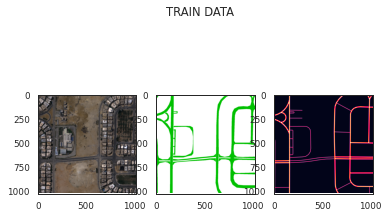

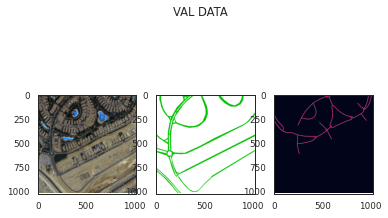

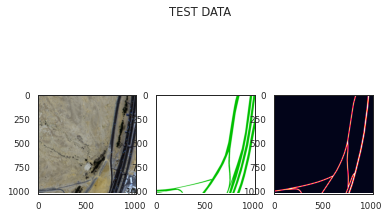

In [8]:
import matplotlib.pyplot as plt
i = 10

with h5py.File(FILE_PATH, 'r') as hdf5_file:
    plt.suptitle('TRAIN DATA')
    plt.subplot(131)
    plt.imshow(hdf5_file[TRAIN_IMG_PATH][i][:, :, :3])
    plt.subplot(132)
    plt.imshow(hdf5_file[TRAIN_LABEL_PATH][i])
    plt.subplot(133)
    plt.imshow(hdf5_file[TRAIN_IMG_PATH][i][:, :, 4])
    plt.show()
    
    plt.suptitle('VAL DATA')
    plt.subplot(131)
    plt.imshow(hdf5_file[VAL_IMG_PATH][i][:, :, :3])
    plt.subplot(132)
    plt.imshow(hdf5_file[VAL_LABEL_PATH][i])
    plt.subplot(133)
    plt.imshow(hdf5_file[VAL_IMG_PATH][i][:, :, 4])
    plt.show()
    
    plt.suptitle('TEST DATA')
    plt.subplot(131)
    plt.imshow(hdf5_file[TEST_IMG_PATH][i][:, :, :3])
    plt.subplot(132)
    plt.imshow(hdf5_file[TEST_LABEL_PATH][i])
    plt.subplot(133)
    plt.imshow(hdf5_file[TEST_IMG_PATH][i][:, :, 4])
    plt.show()

## Split and Save image
---

### 함수정의

In [8]:
def get_slice_pos(split_cnt, STRIDE_SIZE, INPUT_SIZE):
    pts = []
    for slice_pos in range(split_cnt):
        pos_i = int(math.floor(slice_pos / 5.0))
        pos_j = int(slice_pos % 5)
        x = STRIDE_SIZE * pos_i
        y = STRIDE_SIZE * pos_j
        pts.append((x, x+INPUT_SIZE, y, y+INPUT_SIZE))
    return pts

In [9]:
def random_crop(img, mask, crop_num, height=256, width=256): 
    cropper = A.RandomCrop(height, width)
    croped = [cropper(image=img, mask=mask) for _ in range(crop_num)]
    return [sub['image'] for sub in croped], [sub['mask'] for sub in croped]

In [10]:
def split_png(img, pts):
    if len(img.shape) == 3:
        sub_imgs = [img[x0:x1, y0:y1, :] for x0, x1, y0, y1 in pts]
    elif len(img.shape) == 2:
        sub_imgs = [img[x0:x1, y0:y1] for x0, x1, y0, y1 in pts]
    return sub_imgs

In [11]:
def save_png_imgs_labels(dataset, i, imgs, labels):
    for img, label in zip(imgs, labels):
        dataset['img'][i, ...] = img
        dataset['label'][i, ...] = label
        i += 1
    return i

### Split

In [12]:
CROP_NUM = 10

In [13]:
STRIDE_SIZE = 192
INPUT_SIZE = 256
SPLIT_CNT = 25
pts = get_slice_pos(SPLIT_CNT, STRIDE_SIZE, INPUT_SIZE)

In [14]:
# change function for 4 channel
def split_and_save(FILE_PATH, BASE_DIR, IMG_PATH, LABEL_PATH, SPLIT_DIR, COLOR, pts, img_size=256, split_cnt=25):
    with h5py.File(FILE_PATH, "a") as f:
        size = f[IMG_PATH].shape[0] * split_cnt
        if 'split' in f[BASE_DIR].keys(): del f[SPLIT_DIR]
        f[BASE_DIR].create_group('split')
        f[BASE_DIR]['split'].create_dataset('img', (size, img_size, img_size, 4), np.uint8)
        f[BASE_DIR]['split'].create_dataset('label', (size, img_size, img_size), np.float32)
        
        sub_idx = 0
        for i in tqdm(range(f[IMG_PATH].shape[0])):
            img = np.concatenate((f[IMG_PATH][i][:,:,:3],np.reshape(f[IMG_PATH][i][:,:,4], f[IMG_PATH][i][:,:,4].shape+(1,))),axis=2)
            
            sub_imgs = split_png(img, pts)

            mask = (f[LABEL_PATH][i] == COLOR)
            mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
            sub_labels = split_png(mask, pts)
            
            sub_idx = save_png_imgs_labels(f[SPLIT_DIR], sub_idx, sub_imgs, sub_labels)

In [15]:
split_and_save(FILE_PATH, BASE_TARIN_DIR, TRAIN_IMG_PATH, TRAIN_LABEL_PATH,
               TRAIN_SPLIT_DIR, COLOR_MAP[1], pts)

split_and_save(FILE_PATH, BASE_VAL_DIR, VAL_IMG_PATH, VAL_LABEL_PATH,
               VAL_SPLIT_DIR, COLOR_MAP[1], pts)

split_and_save(FILE_PATH, BASE_TEST_DIR, TEST_IMG_PATH, TEST_LABEL_PATH,
               TEST_SPLIT_DIR, COLOR_MAP[1], pts)

100%|██████████| 126/126 [00:08<00:00, 14.51it/s]


여기까지 돌리시고

In [16]:
with h5py.File(FILE_PATH, "r") as f:
    print(f[TEST_IMG_PATH][0][:,:,:3].shape)

(1024, 1024, 3)


In [18]:
def find_bins(observations, width):
    minimmum = np.min(observations)
    maximmum = np.max(observations)
    bound_min = -1.0 * (minimmum % width - minimmum)
    bound_max = maximmum - maximmum % width + width
    n = int((bound_max - bound_min) / width) + 1
    bins = np.linspace(bound_min, bound_max, n)
    return bins

data = np.random.random_sample(120) * 100
bins = find_bins(data, 10.0)

0.07143020629882812 : 5.725835267675707%
3.567781448364258 : 4.608599117885325%
7.0641326904296875 : 4.133773754224413%
10.560483932495117 : 4.357220984182489%
14.056835174560547 : 5.1392862890357565%
17.553186416625977 : 2.625504952007397%
21.049537658691406 : 1.1451670535351413%
24.545888900756836 : 0.6982725936189886%
28.042240142822266 : 0.11172361497903818%
31.538591384887695 : 0.05586180748951909%


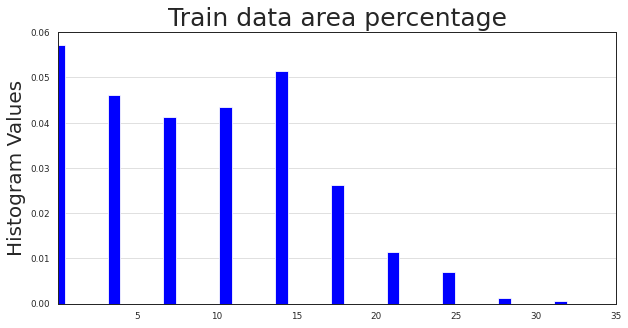

In [123]:
train_cal_np = np.array(train_cal_list)
test_cal_np = np.array(test_cal_list)
val_cal_np = np.array(val_cal_list)
bins = find_bins(train_cal_np, 0.5)
hist_array, bin_array = np.histogram(train_cal_np, density=True)
for i in range(len(hist_array)):
    print(f"{bin_array[i]} : {hist_array[i]*100}%")
#print(hist_array)
#print(bin_array)
#print(min(train_cal_np), max(train_cal_np))

plt.figure(figsize=[10, 5])
plt.xlim(min(bin_array), max(bin_array))
plt.grid(axis='y', alpha=0.75)

plt.ylabel('Histogram Values', fontsize=20)
plt.title('Train data area percentage', fontsize=25)

#for i, v in enumerate(hist_array):
#    plt.text(v, i, " "+str(v), color='blue', va='center', fontweight='bold')

# Create the chart
plt.bar(bin_array[:-1], hist_array, color='blue')
# Display the chart
plt.show()

0.9487152099609375 : 3.867445210553548%
3.9653491973876953 : 4.419937383489769%
6.981983184814453 : 4.143691297021658%
9.998617172241211 : 2.7624608646811057%
13.015251159667969 : 6.629906075234654%
16.031885147094727 : 5.2486756428941%
19.048519134521484 : 3.867445210553548%
22.065153121948242 : 1.3812304323405529%
25.081787109375 : 0.27624608646811055%
28.098421096801758 : 0.5524921729362211%


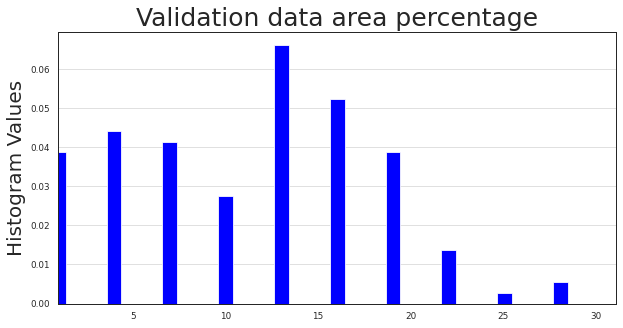

In [124]:
hist_array, bin_array = np.histogram(val_cal_np, density=True)
for i in range(len(hist_array)):
    print(f"{bin_array[i]} : {hist_array[i]*100}%")
plt.figure(figsize=[10, 5])
plt.xlim(min(bin_array), max(bin_array))
plt.grid(axis='y', alpha=0.75)


plt.ylabel('Histogram Values', fontsize=20)
plt.title('Validation data area percentage', fontsize=25)

#for i, v in enumerate(hist_array):
#    plt.text(v, i, " "+str(v), color='blue', va='center', fontweight='bold')

# Create the chart
plt.bar(bin_array[:-1], hist_array, color='blue')
# Display the chart
plt.show()

0.03032684326171875 : 5.811982013815274%
2.761411666870117 : 4.358986510361455%
5.492496490478516 : 4.940184711742983%
8.223581314086914 : 4.940184711742983%
10.954666137695312 : 5.521382913124511%
13.685750961303711 : 4.358986510361455%
16.41683578491211 : 2.905991006907637%
19.147920608520508 : 2.0341937048353462%
21.879005432128906 : 1.162396402763055%
24.610090255737305 : 0.5811982013815274%


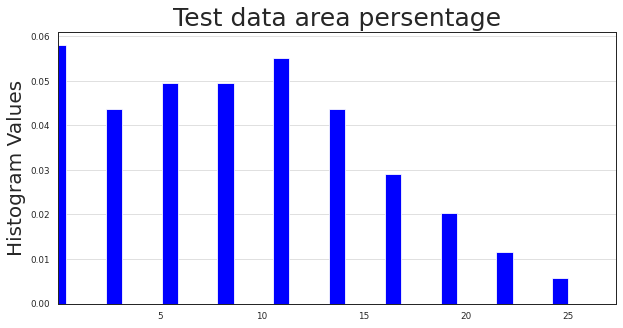

In [125]:
hist_array, bin_array = np.histogram(test_cal_np, density=True)
for i in range(len(hist_array)):
    print(f"{bin_array[i]} : {hist_array[i]*100}%")
plt.figure(figsize=[10, 5])
plt.xlim(min(bin_array), max(bin_array))
plt.grid(axis='y', alpha=0.75)

plt.ylabel('Histogram Values', fontsize=20)
plt.title('Test data area persentage', fontsize=25)

#for i, v in enumerate(hist_array):
#    plt.text(v, i, " "+str(v), color='blue', va='center', fontweight='bold')

# Create the chart
plt.bar(bin_array[:-1], hist_array, color='blue')
# Display the chart
plt.show()

분포도를 통해 자를 데이터 수치를 정한다.
- 0.8% => 전체 데이터의 1%를 차지하는 갯수가 나온다. 
- 2% => 전체 데이터의 10%를 차지하는 갯수가 나온다. 

In [134]:
print(len([x for x in train_cal_np if x < 2]))
print(len([x for x in val_cal_np if x < 2]))
print(len([x for x in test_cal_np if x < 2]))

103
2
13


In [135]:
train_small_list = [i for i,v in enumerate(train_cal_np) if v < 2]
val_small_list = [i for i,v in enumerate(val_cal_np) if v < 2]
test_small_list = [i for i,v in enumerate(test_cal_np) if v < 2]

In [131]:
print("sparse train data")
print(train_small_list)


print("sparse test data")
print(test_small_list)


sparse train data
[5, 6, 11, 14, 37, 48, 60, 61, 63, 64, 65, 79, 80, 82, 94, 98, 99, 110, 150, 152, 161, 164, 170, 175, 177, 178, 181, 184, 185, 188, 189, 193, 194, 195, 198, 199, 201, 202, 203, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 220, 221, 237, 253, 256, 277, 295, 297, 298, 304, 310, 316, 317, 323, 324, 348, 367, 374, 375, 431, 432, 445, 452, 507, 514, 540, 550, 559, 560, 568, 569, 570, 579, 586, 587, 588, 589, 633, 635, 638, 639, 640, 641, 642, 651, 657, 659, 660, 664, 665, 668, 669, 672, 673, 674, 675, 677, 678, 682, 683, 684, 685, 686, 691, 693, 698, 701, 702, 703, 706, 707, 708, 709, 710, 714, 715, 718, 719, 720, 722, 723, 727, 728, 729, 730, 732, 733, 734, 735, 737, 738, 739, 742, 743, 744, 746, 748, 749, 750, 751, 752, 755, 756, 757, 758, 759, 760, 764, 765, 766, 767, 769, 770, 771, 772, 773, 775, 776, 777, 778, 782, 820, 879, 903, 944, 953]
sparse test data
[9, 28, 30, 37, 58, 75, 76, 83, 86, 89, 91, 92, 94, 96, 97, 98, 99, 100, 102, 103, 123]


In [ ]:
os.path.join(val_ori_label_path,val_ori_label_list[0])

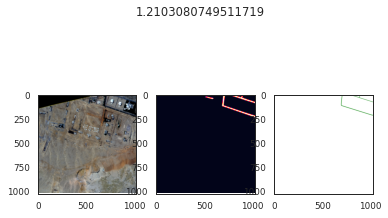

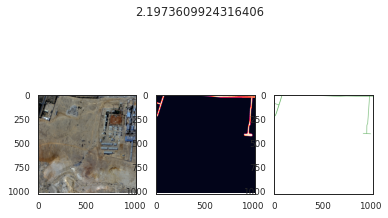

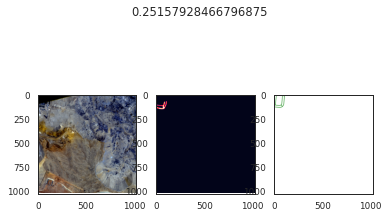

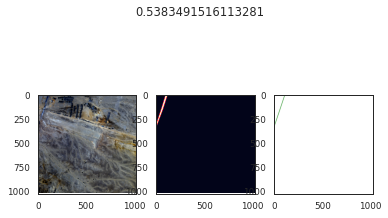

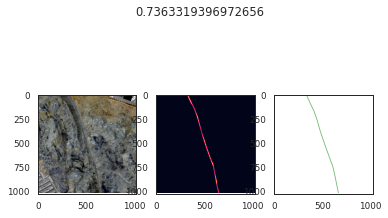

...

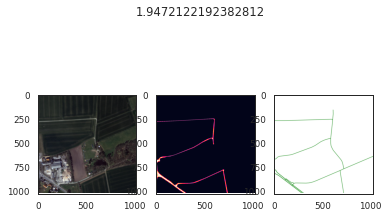

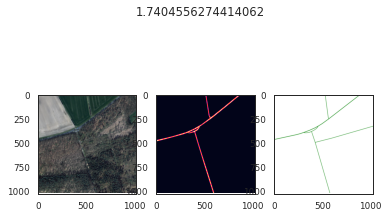

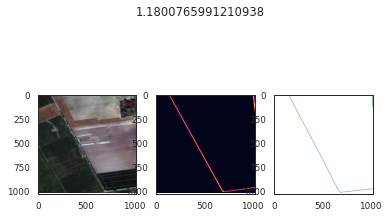

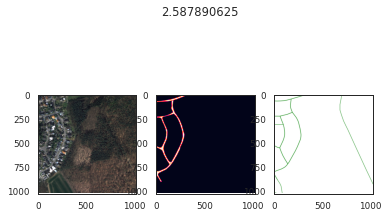

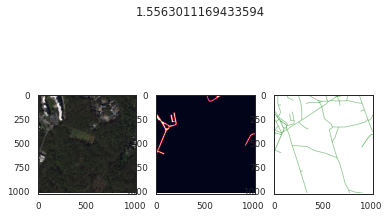

KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

In [132]:
with h5py.File(FILE_PATH, "r") as f:
    
    for i in train_small_list:
        img = f[TRAIN_IMG_PATH][i][:, :, :3]
        mask = (f[TRAIN_LABEL_PATH][i] == COLOR_MAP[1])
        mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
        total = 1024*1024
        building_area = mask.sum()
        cal = (building_area / total)*100
        plt.suptitle(cal)
        plt.subplot(131)
        plt.imshow(img)
        plt.subplot(132)
        plt.imshow(mask)
        plt.subplot(133)
        img = plt.imread(os.path.join(train_ori_label_path,train_ori_label_list[i]))
        #plt.imshow(img)
        #plt.show()
    
    count = 0
    for i in test_small_list:
        img = f[TEST_IMG_PATH][i][:,:,:3]
        mask = (f[TEST_LABEL_PATH][i] == COLOR_MAP[1])
        mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
        total = 1024*1024
        building_area = mask.sum()
        cal = (building_area / total)*100
        plt.suptitle(f"{i}th : {cal}")
        plt.subplot(131)
        plt.imshow(img)
        plt.subplot(132)
        plt.imshow(mask)
        plt.subplot(133)
        img = plt.imread(os.path.join(test_ori_label_path,test_ori_label_list[i]))
        
        #plt.imshow(img)
        #plt.show()
        
    
    for i in val_small_list:
        img = f[VAL_IMG_PATH][i][:, :, :3]
        mask = (f[VAL_LABEL_PATH][i] == COLOR_MAP[1])
        mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
        plt.suptitle(cal)
        plt.subplot(131)
        plt.imshow(img)
        plt.subplot(132)
        plt.imshow(mask)
        plt.subplot(133)
        img = plt.imread(os.path.join(test_ori_label_path,test_ori_label_list[i]))
        plt.imshow(img)
        plt.show()
    

     

In [105]:
print(train_sparse_list1)
print(val_sparse_list1)
print(test_sparse_list1)
TRAIN_TRIM_DIR = f'{Path(BASE_TARIN_DIR)}/trim'
TEST_TRIM_DIR = f'{Path(BASE_TEST_DIR)}/trim'
VAL_TRIM_DIR = f'{Path(BASE_VAL_DIR)}/trim'

[324, 374]
[]
[]


In [136]:
from matplotlib import image 
with h5py.File(FILE_PATH, "a") as f:
    train_size = f[TRAIN_IMG_PATH].shape[0] - len(train_small_list)
    if 'trim' in f[BASE_TARIN_DIR].keys(): del f[TRAIN_TRIM_DIR]
    f[BASE_TARIN_DIR].create_group('trim')
    f[BASE_TARIN_DIR]['trim'].create_dataset('img', (train_size, 1024, 1024, IMG_CHANNELS), np.uint8)
    f[BASE_TARIN_DIR]['trim'].create_dataset('label', (train_size, 1024, 1024), np.float32)
    
    val_size = f[VAL_IMG_PATH].shape[0] - 0
    if 'trim' in f[BASE_VAL_DIR].keys(): del f[VAL_TRIM_DIR]
    f[BASE_VAL_DIR].create_group('trim')
    f[BASE_VAL_DIR]['trim'].create_dataset('img', (val_size, 1024, 1024, IMG_CHANNELS), np.uint8)
    f[BASE_VAL_DIR]['trim'].create_dataset('label', (val_size, 1024, 1024), np.float32)

    test_size = f[TEST_IMG_PATH].shape[0] - len(test_small_list)
    if 'trim' in f[BASE_TEST_DIR].keys(): del f[TEST_TRIM_DIR]
    f[BASE_TEST_DIR].create_group('trim')
    f[BASE_TEST_DIR]['trim'].create_dataset('img', (test_size, 1024, 1024, IMG_CHANNELS), np.uint8)
    f[BASE_TEST_DIR]['trim'].create_dataset('label', (test_size, 1024, 1024), np.float32)
    
    sub_idx = 0
    count = 0
    for i in tqdm(range(f[TRAIN_IMG_PATH].shape[0])):
        if i in train_small_list :
            continue
        img = f[TRAIN_IMG_PATH][i]
        mask = (f[TRAIN_LABEL_PATH][i] == ROAD_COLOR_MAP)
        mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
        f[TRAIN_TRIM_DIR]['img'][count,...] = img  
        f[TRAIN_TRIM_DIR]['label'][count,...] = mask
        
        count += 1
    sub_idx = 0
    count = 0
    for i in tqdm(range(f[VAL_IMG_PATH].shape[0])):
        if i in val_small_list :
            continue
        img = f[VAL_IMG_PATH][i]
        mask = (f[VAL_LABEL_PATH][i] == ROAD_COLOR_MAP)
        mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
        f[VAL_TRIM_DIR]['img'][count,...] = img  
        f[VAL_TRIM_DIR]['label'][count,...] = mask
        count += 1
        
    sub_idx = 0
    count = 0
    for i in tqdm(range(f[TEST_IMG_PATH].shape[0])):
        img = f[TEST_IMG_PATH][i]
        if i in test_small_list : 
            continue
        #mask = (f[TEST_LABEL_PATH][i] == ROAD_COLOR_MAP)
        #mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
        #sub_imgs, sub_labels = random_crop(img, mask, CROP_NUM)
        mask = (f[TEST_LABEL_PATH][i] == ROAD_COLOR_MAP)
        mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
        f[TEST_TRIM_DIR]['img'][count,...] = img  
        f[TEST_TRIM_DIR]['label'][count,...] = mask
        
        count += 1

100%|██████████| 126/126 [00:03<00:00, 35.86it/s]


In [114]:
with h5py.File(FILE_PATH, "a") as f:
    print(len(f[TEST_TRIM_DIR]['img']))

123


In [14]:
with h5py.File(FILE_PATH, "a") as f:
    train_size = f[TRAIN_IMG_PATH].shape[0] * CROP_NUM
    if 'split' in f[BASE_TARIN_DIR].keys(): del f[TRAIN_SPLIT_DIR]
    f[BASE_TARIN_DIR].create_group('split')
    f[BASE_TARIN_DIR]['split'].create_dataset('img', (train_size, 256, 256, IMG_CHANNELS), np.uint8)
    f[BASE_TARIN_DIR]['split'].create_dataset('label', (train_size, 256, 256), np.float32)

    val_size = f[VAL_IMG_PATH].shape[0] * CROP_NUM
    if 'split' in f[BASE_VAL_DIR].keys(): del f[VAL_SPLIT_DIR]
    f[BASE_VAL_DIR].create_group('split')
    f[BASE_VAL_DIR]['split'].create_dataset('img', (val_size, 256, 256, IMG_CHANNELS), np.uint8)
    f[BASE_VAL_DIR]['split'].create_dataset('label', (val_size, 256, 256), np.float32)

    test_size = f[TEST_IMG_PATH].shape[0] * CROP_NUM
    if 'split' in f[BASE_TEST_DIR].keys(): del f[TEST_SPLIT_DIR]
    f[BASE_TEST_DIR].create_group('split')
    f[BASE_TEST_DIR]['split'].create_dataset('img', (test_size, 256, 256, IMG_CHANNELS), np.uint8)
    f[BASE_TEST_DIR]['split'].create_dataset('label', (test_size, 256, 256), np.float32)

    sub_idx = 0
    for i in tqdm(range(f[TRAIN_IMG_PATH].shape[0])):
        img = f[TRAIN_IMG_PATH][i]
        mask = (f[TRAIN_LABEL_PATH][i] == ROAD_COLOR_MAP)
        mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
        sub_imgs, sub_labels = random_crop(img, mask, CROP_NUM)
        
        sub_idx = save_png_imgs_labels(f[TRAIN_SPLIT_DIR], sub_idx, sub_imgs, sub_labels)

    sub_idx = 0
    for i in tqdm(range(f[VAL_IMG_PATH].shape[0])):
        img = f[VAL_IMG_PATH][i]
        mask = (f[VAL_LABEL_PATH][i] == ROAD_COLOR_MAP)
        mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
        sub_imgs, sub_labels = random_crop(img, mask, CROP_NUM)

        sub_idx = save_png_imgs_labels(f[VAL_SPLIT_DIR], sub_idx, sub_imgs, sub_labels)
        
    sub_idx = 0
    for i in tqdm(range(f[TEST_IMG_PATH].shape[0])):
        img = f[TEST_IMG_PATH][i]
        mask = (f[TEST_LABEL_PATH][i] == ROAD_COLOR_MAP)
        mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
        sub_imgs, sub_labels = random_crop(img, mask, CROP_NUM)

        sub_idx = save_png_imgs_labels(f[TEST_SPLIT_DIR], sub_idx, sub_imgs, sub_labels)

 40%|████      | 413/1024 [00:12<00:18, 32.84it/s]


KeyboardInterrupt: 

### 4채널 학습

여기부터 시작하세요

In [17]:
IMG_CHANNELS = 4
with h5py.File(FILE_PATH, "a") as f:
    train_size = f[TRAIN_IMG_PATH].shape[0] * CROP_NUM
    if 'split' in f[BASE_TARIN_DIR].keys(): del f[TRAIN_SPLIT_DIR]
    f[BASE_TARIN_DIR].create_group('split')
    f[BASE_TARIN_DIR]['split'].create_dataset('img', (train_size, 256, 256, IMG_CHANNELS), np.uint8)
    f[BASE_TARIN_DIR]['split'].create_dataset('label', (train_size, 256, 256), np.float32)

    val_size = f[VAL_IMG_PATH].shape[0] * CROP_NUM
    if 'split' in f[BASE_VAL_DIR].keys(): del f[VAL_SPLIT_DIR]
    f[BASE_VAL_DIR].create_group('split')
    f[BASE_VAL_DIR]['split'].create_dataset('img', (val_size, 256, 256, IMG_CHANNELS), np.uint8)
    f[BASE_VAL_DIR]['split'].create_dataset('label', (val_size, 256, 256), np.float32)

    test_size = f[TEST_IMG_PATH].shape[0] * CROP_NUM
    if 'split' in f[BASE_TEST_DIR].keys(): del f[TEST_SPLIT_DIR]
    f[BASE_TEST_DIR].create_group('split')
    f[BASE_TEST_DIR]['split'].create_dataset('img', (test_size, 256, 256, IMG_CHANNELS), np.uint8)
    f[BASE_TEST_DIR]['split'].create_dataset('label', (test_size, 256, 256), np.float32)

    sub_idx = 0
    for i in tqdm(range(f[TRAIN_IMG_PATH].shape[0])):
        img = np.concatenate((f[TRAIN_IMG_PATH][i][:,:,:3],np.reshape(f[TRAIN_IMG_PATH][i][:,:,4], f[TRAIN_IMG_PATH][i][:,:,4].shape+(1,))),axis=2) 
        mask = (f[TRAIN_LABEL_PATH][i] == ROAD_COLOR_MAP)
        mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
        sub_imgs, sub_labels = random_crop(img, mask, CROP_NUM)
        
        sub_idx = save_png_imgs_labels(f[TRAIN_SPLIT_DIR], sub_idx, sub_imgs, sub_labels)

    sub_idx = 0
    for i in tqdm(range(f[VAL_IMG_PATH].shape[0])):
        img = np.concatenate((f[VAL_IMG_PATH][i][:,:,:3],np.reshape(f[VAL_IMG_PATH][i][:,:,4], f[VAL_IMG_PATH][i][:,:,4].shape+(1,))),axis=2) 
        mask = (f[VAL_LABEL_PATH][i] == ROAD_COLOR_MAP)
        mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
        sub_imgs, sub_labels = random_crop(img, mask, CROP_NUM)

        sub_idx = save_png_imgs_labels(f[VAL_SPLIT_DIR], sub_idx, sub_imgs, sub_labels)
        
    sub_idx = 0
    for i in tqdm(range(f[TEST_IMG_PATH].shape[0])):
        img = np.concatenate((f[TEST_IMG_PATH][i][:,:,:3],np.reshape(f[TEST_IMG_PATH][i][:,:,4], f[TEST_IMG_PATH][i][:,:,4].shape+(1,))),axis=2) 
        mask = (f[TEST_LABEL_PATH][i] == ROAD_COLOR_MAP)
        mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
        sub_imgs, sub_labels = random_crop(img, mask, CROP_NUM)

        sub_idx = save_png_imgs_labels(f[TEST_SPLIT_DIR], sub_idx, sub_imgs, sub_labels)

100%|██████████| 126/126 [00:05<00:00, 23.95it/s]


### Sample

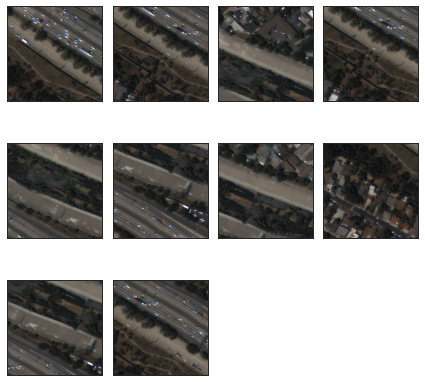

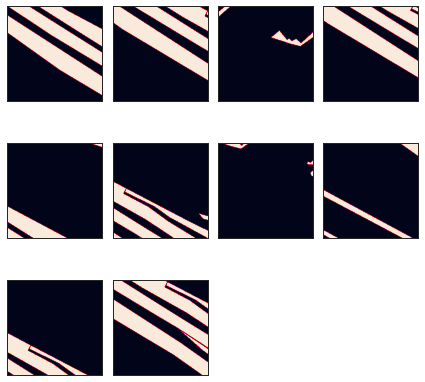

In [18]:
with h5py.File(FILE_PATH, "a") as f:
    idx = 125
    imgs = f[TEST_SPLIT_IMG_PATH][idx*10:idx*10+10]
    plt.figure(figsize=(6, 6))
    for i, sub_img in enumerate(imgs):
        plt.subplot(3, 4, i+1)
        ax = plt.gca()
        ax.axes.xaxis.set_visible(False)
        ax.axes.yaxis.set_visible(False)
        plt.imshow(sub_img[:, :, :3])
            
    plt.tight_layout()
    plt.show()
    
    masks = f[TEST_SPLIT_LABEL_PATH][idx*10:idx*10+10]
    plt.figure(figsize=(6, 6))
    for i, sub_img in enumerate(masks):
        plt.subplot(3, 4, i+1)
        ax = plt.gca()
        ax.axes.xaxis.set_visible(False)
        ax.axes.yaxis.set_visible(False)
        plt.imshow(sub_img)
            
    plt.tight_layout()
    plt.show()

## Dataloader and utility functions
---

In [19]:
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    # for visualizing osm layer
    fig, axs = plt.subplots(1, n, figsize=(10, 5))
    
    for i, (name, image) in enumerate(images.items()):
        axs[i].set_xticks([])
        axs[i].set_yticks([])
        axs[i].set_title(' '.join(name.split('_')).title())
        
        # if channel is 5, then osm layer is added
        if image.shape[-1] == 5 or image.shape[-1] == 4:
            axs[i].imshow(image[:, :, :3])
        else :
            axs[i].imshow(image)
        
    plt.tight_layout()
    plt.show()

In [20]:
# helper function for data visualization    
def denormalize(x):
    """Scale image to range 0..1 for correct plot"""
    x_max = np.percentile(x, 98)
    x_min = np.percentile(x, 2)    
    x = (x - x_min) / (x_max - x_min)
    x = x.clip(0, 1)
    return x

In [21]:
def round_clip_0_1(x, **kwargs):
    return x.round().clip(0, 1)

def get_training_augmentation():
    train_transform = [
        A.RandomRotate90(p=0.5),
        A.RandomRotate90(p=0.5),
        A.RandomRotate90(p=0.5),
        A.Lambda(mask=round_clip_0_1)
    ]
    return A.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        A.Lambda(mask=round_clip_0_1)
    ]
    return A.Compose(test_transform)

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform
    
    Args:
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    
    """
    _transform = [
        A.Lambda(image=preprocessing_fn),
    ]
    return A.Compose(_transform)

In [22]:
class SatelliteGenerator(tf.keras.utils.Sequence):
    '''
    ref: https://github.com/AIFFEL-FREESIA/Model/blob/master/Unet_building_256_2.ipynb
    SatelliteGenerator는 tf.keras.utils.Sequence를 상속받습니다.
    '''
    def __init__(self, 
                 filepath,
                 x_path,
                 y_path,
                 batch_size=8,
                 augmentation=None, 
                 preprocessing=None,
                 is_train=True):
        
        self.filepath = filepath
        self.x_path = x_path
        self.y_path = y_path
        
        self.augmentation = augmentation
        self.preprocessing = preprocessing

        self.size = 0
        with h5py.File(self.filepath, 'r') as f:
            self.size = f[x_path].shape[0]
            
        self.batch_size = batch_size
        self.is_train = is_train
    
    def __len__(self):
        return math.ceil(self.size / self.batch_size)

    def __getitem__(self, index):
        with h5py.File(self.filepath, 'r') as f:
            images = f[self.x_path][index*self.batch_size : (index + 1)*self.batch_size]
            masks = f[self.y_path][index*self.batch_size : (index + 1)*self.batch_size]
            res = [(img, mask) for img, mask in zip(images, masks)]

            if self.augmentation:
                res = [self.augmentation(image=img, mask=mask) for img, mask in res]
                res = [(r['image'], r['mask']) for r in res]
            if self.preprocessing:
                res = [self.preprocessing(image=img, mask=mask) for img, mask in res]
                res = [(r['image'], r['mask']) for r in res]
            
            images = np.array([img for img, _ in res ])
            masks = np.array([mask for _, mask in res ])
            
            return images, masks

    def on_epoch_end(self):
        # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
        self.indexes = np.arange(self.size)
        if self.is_train == True :
            np.random.shuffle(self.indexes)
        
        return self.indexes

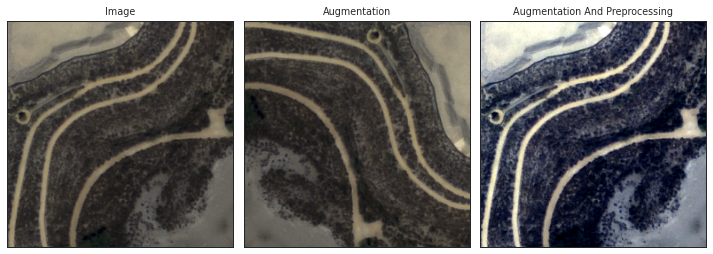

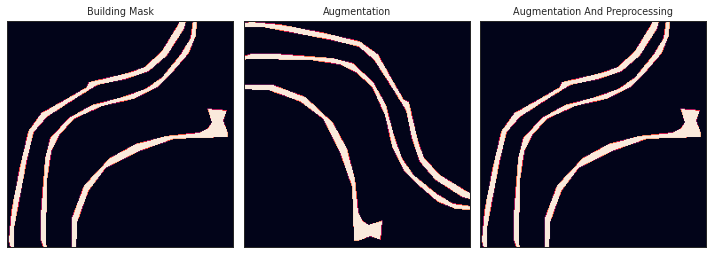

In [23]:
# Lets look at augmented data we have
dataset = SatelliteGenerator(
    FILE_PATH,
    TRAIN_SPLIT_IMG_PATH,
    TRAIN_SPLIT_LABEL_PATH, 
    augmentation=get_training_augmentation()
)

dataset_aug = SatelliteGenerator(
    FILE_PATH,
    TRAIN_SPLIT_IMG_PATH,
    TRAIN_SPLIT_LABEL_PATH, 
    augmentation=get_training_augmentation())

preprocess_input = sm.get_preprocessing('efficientnetb3')
dataset_aug_pre = SatelliteGenerator(
    FILE_PATH,
    TRAIN_SPLIT_IMG_PATH,
    TRAIN_SPLIT_LABEL_PATH,
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input)
)

idx = 1204
image, mask = dataset[idx] # get some sample
image_aug, mask_aug = dataset_aug[idx]
image_aug_pre, mask_aug_pre = dataset_aug_pre[idx]


visualize(
    image=image[0], 
    augmentation=image_aug[0],
    augmentation_and_preprocessing=denormalize(image_aug_pre[0])
)

visualize(
    building_mask=mask[0],
    augmentation=mask_aug[0],
    augmentation_and_preprocessing=mask_aug_pre[0]
)

# Train Model

### functions

In [24]:
def get_datagenerator(BATCH_SIZE=8, BACKBONE='efficientnetb3'):
    # Dataset for train images
    preprocess_input = sm.get_preprocessing(BACKBONE)
    train_datagenerator = SatelliteGenerator(
        FILE_PATH,
        TRAIN_SPLIT_IMG_PATH,
        TRAIN_SPLIT_LABEL_PATH,
        batch_size=BATCH_SIZE,
        augmentation=get_training_augmentation(),
        preprocessing=get_preprocessing(preprocess_input),
        is_train=True
    )

    # Dataset for validation image
    valid_datagenerator = SatelliteGenerator(
        FILE_PATH,
        VAL_SPLIT_IMG_PATH, 
        VAL_SPLIT_LABEL_PATH, 
        batch_size=BATCH_SIZE,
        augmentation=get_validation_augmentation(),
        preprocessing=get_preprocessing(preprocess_input),
        is_train=False
    )

    return train_datagenerator, valid_datagenerator

In [25]:
import time
import datetime
def logging_time(original_fn):
    def wrapper_fn(*args, **kwargs):
        start_time = time.time()
        
        result = original_fn(*args, **kwargs)
        
        sec = time.time()-start_time
        times = str(datetime.timedelta(seconds=sec)).split(".")
        times = times[0]
        print(f'WorkingTime : {times}')
        return result
    return wrapper_fn

In [26]:
def get_cosine_lr(initial_learning_rate, t_period, lr_min=0.):
    return tf.keras.experimental.CosineDecay(
        initial_learning_rate=initial_learning_rate,
        decay_steps=t_period, alpha=lr_min / initial_learning_rate)

In [27]:
def get_model(model_name, optim, train, valid, MODEL_PATH, patience=5):
    BACKBONE = 'efficientnetb3'
    CLASSES = ['road']

    # define network parameters
    n_classes = 1 if len(CLASSES) == 1 else (len(CLASSES) + 1)  # case for binary and multiclass segmentation
    activation = 'sigmoid' if n_classes == 1 else 'softmax'

    #create model
    tf.random.set_seed(2)
    model = sm.Unet(BACKBONE, 
                    classes=n_classes, 
                    activation=activation,
                    input_shape=(None, None, 4),
                    encoder_weights=None)

    # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
    dice_loss = sm.losses.DiceLoss()
    focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
    total_loss = dice_loss + (1 * focal_loss)
    metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

    # compile keras model with defined optimozer, loss and metrics
    model.compile(optim, total_loss, metrics)
    
    log_dir = f"./logs/fit/{model_name}"
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
    callbacks = [
        keras.callbacks.ModelCheckpoint(MODEL_PATH, save_weights_only=True, save_best_only=True, mode='min', monitor='val_loss'),
        keras.callbacks.ReduceLROnPlateau(),
        tensorboard_callback,
        keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=patience)
    ]
    
    return model, callbacks

In [28]:
def show_history_plot(history):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    keys = [('loss', 'val_loss'), ('iou_score', 'val_iou_score'), ('f1-score', 'val_f1-score')]
    
    for (train, val), ax in zip(keys, axes):
        ax.plot(history[train])
        ax.plot(history[val])
        ax.set_title(f'Model {train}')
        ax.set_ylabel(train)
        ax.set_xlabel('Epoch')
        ax.legend(['Train', 'Validation'], loc='upper left')

    plt.tight_layout()
    plt.show()

In [29]:
def inference(model, img, pts):
    preprocessing = A.Compose([
        A.Lambda(image=sm.get_preprocessing(BACKBONE)),
    ])

    sub_imgs = split_png(img, pts)
    sub_imgs = [preprocessing(image=img)['image'] for img in sub_imgs]
#     show_spiltd_img(sub_imgs, denor=True)

    sub_imgs = [np.expand_dims(img, axis=0) for img in sub_imgs]
    pre_imgs = [model.predict(img) for img in sub_imgs]
    pre_imgs = [pre[..., 0].squeeze() for pre in pre_imgs]
    pre_imgs = [pre.round().clip(0, 1) for pre in pre_imgs]
#     show_spiltd_img(pre_imgs)
    
    merged = np.zeros((1024, 1024))
    for i, (x0, x1, y0, y1) in enumerate(pts) : 
        sub = (merged[x0:x1, y0:y1] + pre_imgs[i])/2
        sub = np.where(sub - sub//1 > 0, sub+0.00001, sub)
        sub = np.round(sub)
        merged[x0:x1, y0:y1] = sub
    return merged

In [30]:
# 이 코드는 무시하세요
from matplotlib import image
def show_inference(model):
    STRIDE_SIZE = 192
    INPUT_SIZE = 256
    SPLIT_CNT = 25
    pts = get_slice_pos(SPLIT_CNT, STRIDE_SIZE, INPUT_SIZE)
    
    with h5py.File(FILE_PATH, "r") as f:
        for idx in range(5):
            img = f[TEST_IMG_PATH][idx]
            mask = (f[TEST_LABEL_PATH][idx] == ROAD_COLOR_MAP)
            mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
           
            predicted = inference(model, img, pts)
            images = {'Image': img, 
                      'Ground Truth': mask,
                      'Prediction': predicted}

            visualize(
                image=img,
                ground_truth=mask,
                predicted=predicted
            )

In [31]:
# 이 코드로 inference 돌리세요
def show_inference_4ch(model):
    STRIDE_SIZE = 192
    INPUT_SIZE = 256
    SPLIT_CNT = 25
    pts = get_slice_pos(SPLIT_CNT, STRIDE_SIZE, INPUT_SIZE)
    
    with h5py.File(FILE_PATH, "r") as f:
        for idx in range(5):
            img = np.concatenate((f[TEST_IMG_PATH][idx][:,:,:3],np.reshape(f[TEST_IMG_PATH][idx][:,:,4], f[TEST_IMG_PATH][idx][:,:,4].shape+(1,))),axis=2) 
            mask = (f[TEST_LABEL_PATH][idx] == ROAD_COLOR_MAP)
            mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
           
            predicted = inference(model, img, pts)
            images = {'Image': img, 
                      'Ground Truth': mask,
                      'Prediction': predicted}

            visualize(
                image=img,
                ground_truth=mask,
                predicted=predicted
            )

# 비교군 실험 : NIR + OSM layer
### E11_2
- optimizer = Adam, 1e-3
- EPOCHS=25
- Batch=8

In [150]:
lr = 1e-3
BATCH_SIZE = 8
EPOCHS=100
optim = keras.optimizers.Adam(lr)
train_datagenerator, valid_datagenerator = get_datagenerator(BATCH_SIZE=BATCH_SIZE)


In [153]:
model_11_1, callbacks = get_model('E11-1',
                                 optim,
                                  train_datagenerator, 
                                  valid_datagenerator,
                                  './trained_model/E11/E11_1_best_model.h5',
                                  patience=10)

In [154]:
start_time = time.time()

history_11_1 = model_11_1.fit(
    train_datagenerator, 
    steps_per_epoch=len(train_datagenerator), 
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_datagenerator, 
    validation_steps=len(valid_datagenerator))

sec = time.time()-start_time
times = str(datetime.timedelta(seconds=sec)).split(".")
times = times[0]
print(f'WorkingTime : {times}')

Epoch 1/100
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 

Epoch 31/100
1258/1258 [==============================] - 275s 218ms/step - loss: 0.3583 - iou_score: 0.5775 - f1-score: 0.7186 - val_loss: 0.5007 - val_iou_score: 0.4551 - val_f1-score: 0.5938
Epoch 32/100
1258/1258 [==============================] - 275s 218ms/step - loss: 0.3731 - iou_score: 0.5637 - f1-score: 0.7054 - val_loss: 0.5004 - val_iou_score: 0.4587 - val_f1-score: 0.5965
Epoch 33/100
1258/1258 [==============================] - 275s 219ms/step - loss: 0.3580 - iou_score: 0.5781 - f1-score: 0.7166 - val_loss: 0.5480 - val_iou_score: 0.4111 - val_f1-score: 0.5471
Epoch 34/100
1258/1258 [==============================] - 275s 218ms/step - loss: 0.3518 - iou_score: 0.5846 - f1-score: 0.7245 - val_loss: 0.5134 - val_iou_score: 0.4558 - val_f1-score: 0.5997
Epoch 35/100
1258/1258 [==============================] - 275s 219ms/step - loss: 0.3647 - iou_score: 0.5726 - f1-score: 0.7133 - val_loss: 0.5407 - val_iou_score: 0.4154 - val_f1-score: 0.5540
Epoch 36/100
1258/1258 [======

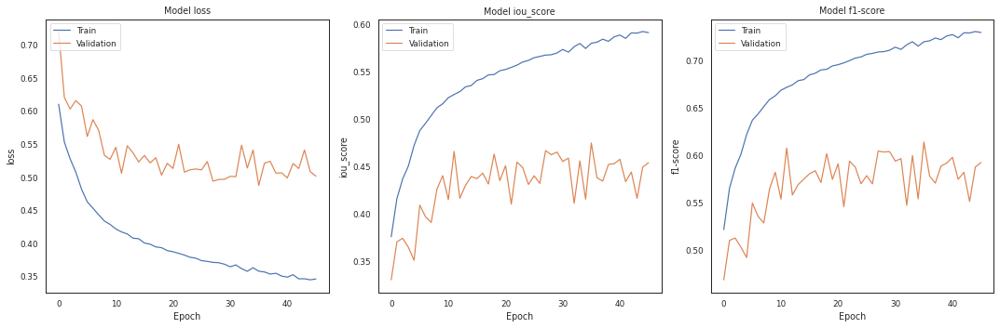

In [155]:
show_history_plot(history_11_1.history)

#### evaluation

In [156]:
model_11_1.load_weights('./trained_model/E11/E11_1_best_model.h5')

In [158]:
preprocess_input = sm.get_preprocessing('efficientnetb3')
test_datagenerator = SatelliteGenerator(
    FILE_PATH,
    TEST_SPLIT_IMG_PATH, 
    TEST_SPLIT_LABEL_PATH, 
    batch_size=BATCH_SIZE,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
    is_train=False
)
val_metrix = model_11_1.evaluate(valid_datagenerator)
test_metrix = model_11_1.evaluate(test_datagenerator)

154/154 [==============================] - 53s 348ms/step - loss: 0.4686 - iou_score: 0.4928 - f1-score: 0.6338


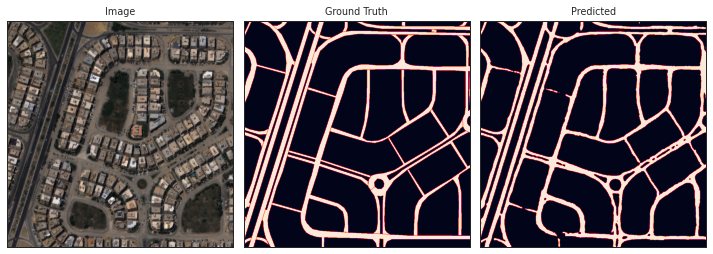

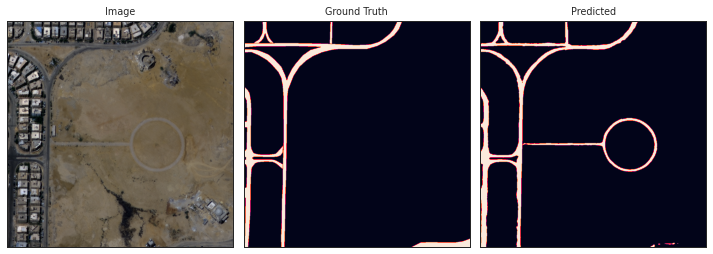

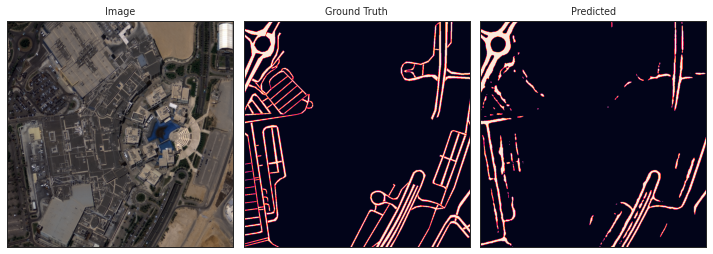

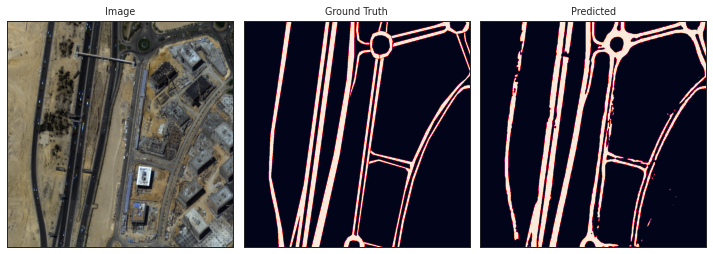

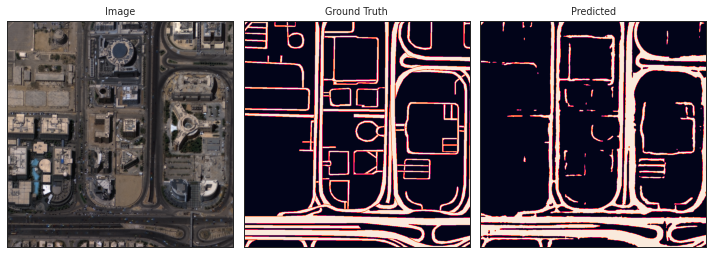

In [170]:
BACKBONE = 'efficientnetb3'
show_inference(model_11_1)

# 대조군 실험 : NIR + OSM layer
### E11_2

In [204]:
train_datagenerator_2, valid_datagenerator_2 = get_datagenerator(BATCH_SIZE=BATCH_SIZE)
optim_2 = keras.optimizers.Adam(lr)

In [205]:
model_11_2, callbacks_2 = get_model('E11-2',
                                 optim_2,
                                  train_datagenerator_2, 
                                  valid_datagenerator_2,
                                  './trained_model/E11/E11_2_best_model.h5',
                                  patience=10)

In [206]:
start_time = time.time()

history_11_2 = model_11_2.fit(
    train_datagenerator_2, 
    steps_per_epoch=len(train_datagenerator_2), 
    epochs=EPOCHS, 
    callbacks=callbacks_2, 
    validation_data=valid_datagenerator_2, 
    validation_steps=len(valid_datagenerator_2))

sec = time.time()-start_time
times = str(datetime.timedelta(seconds=sec)).split(".")
times = times[0]
print(f'WorkingTime : {times}')

Epoch 1/100
1280/1280 [==============================] - 296s 223ms/step - loss: 0.6482 - iou_score: 0.3524 - f1-score: 0.4942 - val_loss: 0.6816 - val_iou_score: 0.3323 - val_f1-score: 0.4707
Epoch 2/100
1280/1280 [==============================] - 286s 223ms/step - loss: 0.5608 - iou_score: 0.4107 - f1-score: 0.5569 - val_loss: 0.5943 - val_iou_score: 0.3932 - val_f1-score: 0.5352
Epoch 3/100
1280/1280 [==============================] - 285s 223ms/step - loss: 0.5316 - iou_score: 0.4321 - f1-score: 0.5773 - val_loss: 0.5595 - val_iou_score: 0.4038 - val_f1-score: 0.5465
Epoch 4/100
1280/1280 [==============================] - 285s 223ms/step - loss: 0.5013 - iou_score: 0.4553 - f1-score: 0.6040 - val_loss: 0.5802 - val_iou_score: 0.3929 - val_f1-score: 0.5394
Epoch 5/100
1280/1280 [==============================] - 283s 221ms/step - loss: 0.4891 - iou_score: 0.4662 - f1-score: 0.6135 - val_loss: 0.5874 - val_iou_score: 0.3658 - val_f1-score: 0.5044
Epoch 6/100
1280/1280 [============

In [207]:
model_11_2.load_weights('./trained_model/E11/E11_2_best_model.h5')

In [208]:
preprocess_input = sm.get_preprocessing('efficientnetb3')
test_datagenerator_2 = SatelliteGenerator(
    FILE_PATH,
    TEST_SPLIT_IMG_PATH, 
    TEST_SPLIT_LABEL_PATH, 
    batch_size=BATCH_SIZE,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
    is_train=False
)
val_metrix = model_11_1.evaluate(valid_datagenerator_2)
test_metrix = model_11_1.evaluate(test_datagenerator_2)

158/158 [==============================] - 7s 46ms/step - loss: 0.4659 - iou_score: 0.4982 - f1-score: 0.6359


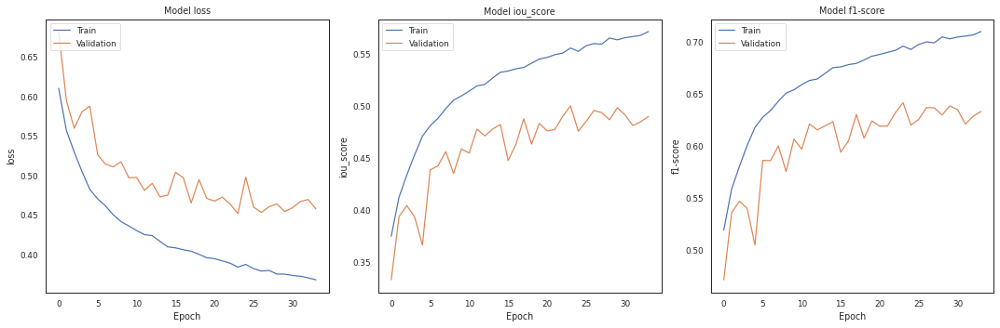

In [210]:
show_history_plot(history_11_2.history)

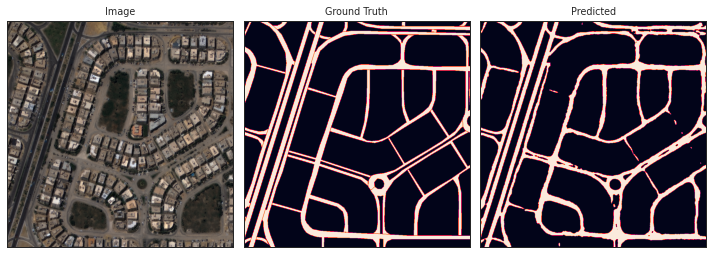

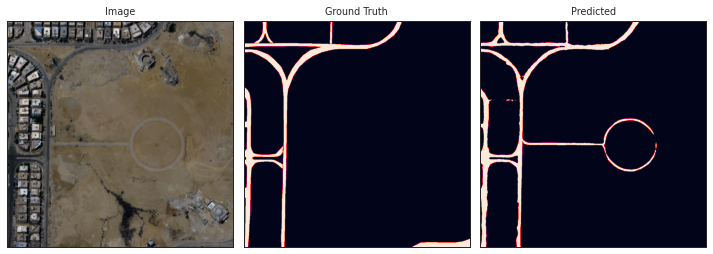

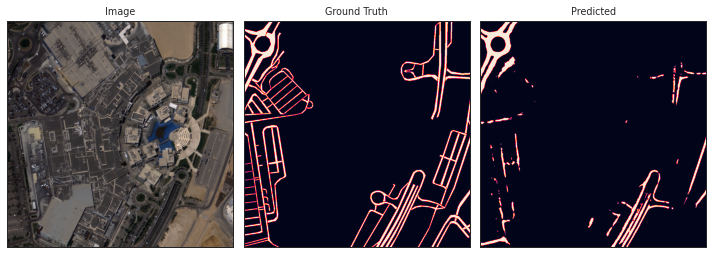

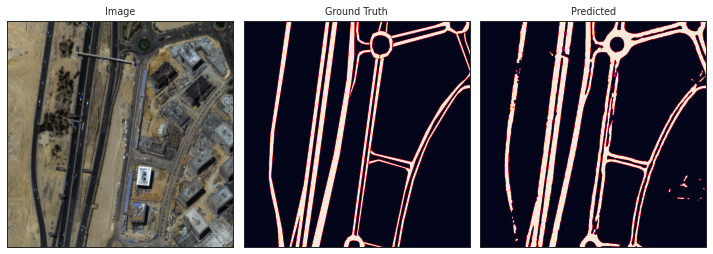

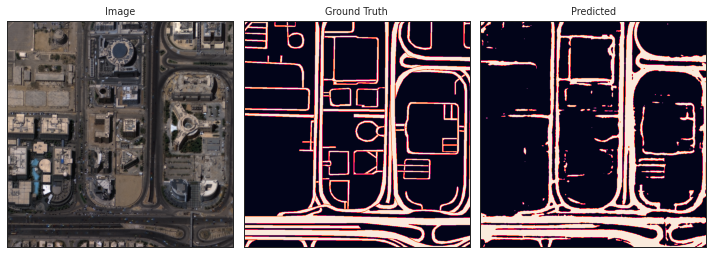

In [209]:
BACKBONE = 'efficientnetb3'
show_inference(model_11_2)

### E11-3 split한 사진에서 sparse한 road를 빼내기 랄랄라

In [277]:
train_datagenerator_3, valid_datagenerator_3 = get_datagenerator(BATCH_SIZE=BATCH_SIZE)
optim_3 = keras.optimizers.Adam(lr)

In [278]:
model_11_3, callbacks_3 = get_model('E11-3',
                                 optim_3,
                                  train_datagenerator_3, 
                                  valid_datagenerator_3,
                                  './trained_model/E11/E11_3_best_model.h5',
                                  patience=10)

/home/aiffel-dj15/anaconda3/envs/aiffel/lib/python3.7/site-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


In [279]:
start_time = time.time()

history_11_3 = model_11_3.fit(
    train_datagenerator_3, 
    steps_per_epoch=len(train_datagenerator_3), 
    epochs=EPOCHS, 
    callbacks=callbacks_3, 
    validation_data=valid_datagenerator_3, 
    validation_steps=len(valid_datagenerator_3))

sec = time.time()-start_time
times = str(datetime.timedelta(seconds=sec)).split(".")
times = times[0]
print(f'WorkingTime : {times}')

Epoch 1/100
1280/1280 [==============================] - 295s 221ms/step - loss: 0.6601 - iou_score: 0.3449 - f1-score: 0.4867 - val_loss: 0.6391 - val_iou_score: 0.3578 - val_f1-score: 0.4996
Epoch 2/100
1280/1280 [==============================] - 291s 227ms/step - loss: 0.5890 - iou_score: 0.3843 - f1-score: 0.5298 - val_loss: 0.6146 - val_iou_score: 0.3767 - val_f1-score: 0.5177
Epoch 3/100
1280/1280 [==============================] - 285s 223ms/step - loss: 0.5709 - iou_score: 0.4005 - f1-score: 0.5462 - val_loss: 0.6221 - val_iou_score: 0.3623 - val_f1-score: 0.5048
Epoch 4/100
1280/1280 [==============================] - 281s 220ms/step - loss: 0.5508 - iou_score: 0.4128 - f1-score: 0.5604 - val_loss: 0.5855 - val_iou_score: 0.3885 - val_f1-score: 0.5325
Epoch 5/100
1280/1280 [==============================] - 282s 220ms/step - loss: 0.5238 - iou_score: 0.4333 - f1-score: 0.5816 - val_loss: 0.5730 - val_iou_score: 0.3985 - val_f1-score: 0.5437
Epoch 6/100
1280/1280 [============

In [282]:
model_11_3.load_weights('./trained_model/E11/E11_3_best_model.h5')

In [285]:
preprocess_input = sm.get_preprocessing('efficientnetb3')
test_datagenerator_3 = SatelliteGenerator(
    FILE_PATH,
    TEST_SPLIT_IMG_PATH, 
    TEST_SPLIT_LABEL_PATH, 
    batch_size=BATCH_SIZE,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
    is_train=False
)
val_metrix = model_11_3.evaluate(valid_datagenerator_3)
test_metrix = model_11_3.evaluate(test_datagenerator_3)

158/158 [==============================] - 8s 53ms/step - loss: 0.4545 - iou_score: 0.4986 - f1-score: 0.6446


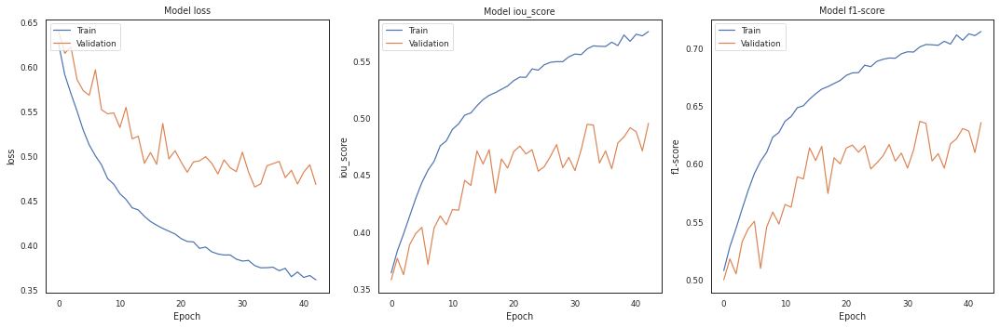

In [283]:
show_history_plot(history_11_3.history)

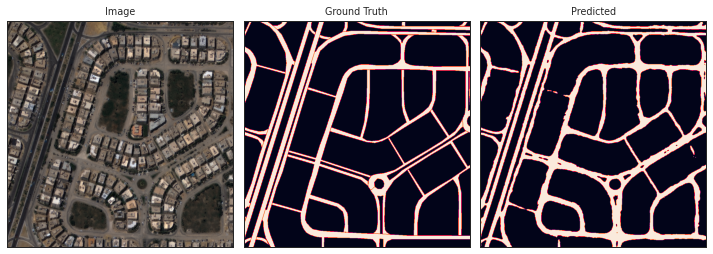

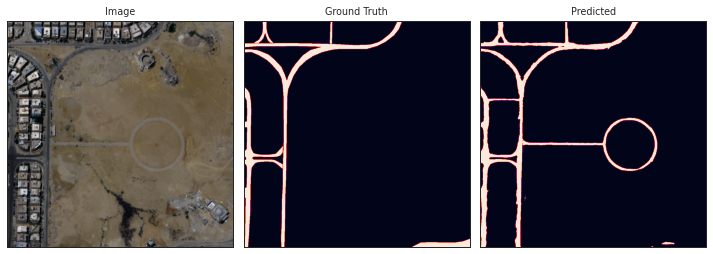

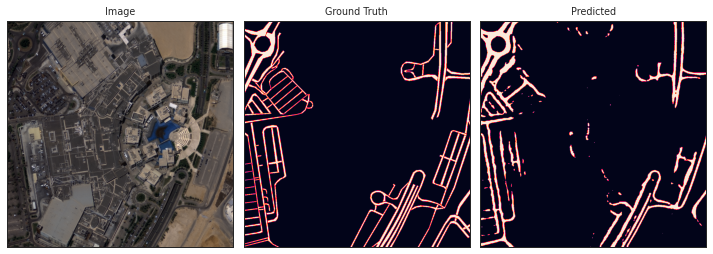

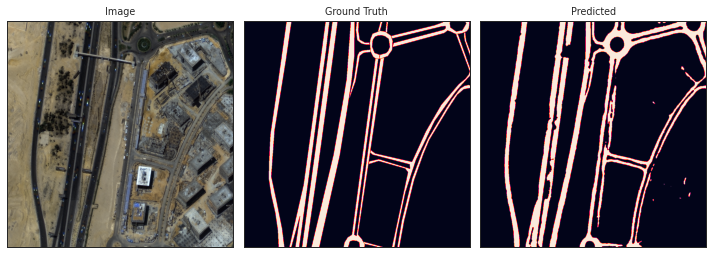

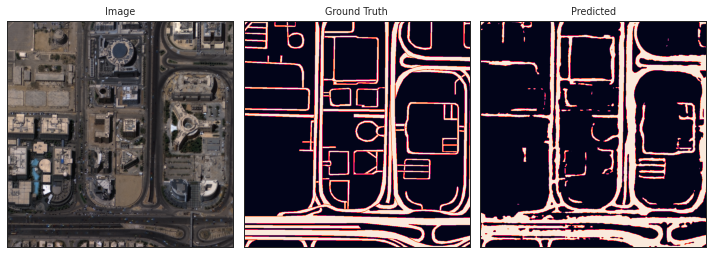

In [289]:
BACKBONE = 'efficientnetb3'
show_inference_4ch(model_11_3)

## Get rid of the sparse 'split' image

In [32]:
with h5py.File(FILE_PATH, "a") as f:
    label_areas = []
    for i in tqdm(range(f[TRAIN_SPLIT_LABEL_PATH].shape[0])):
        label_areas.append(f[TRAIN_SPLIT_LABEL_PATH][i].sum())

100%|██████████| 10240/10240 [00:04<00:00, 2491.91it/s]


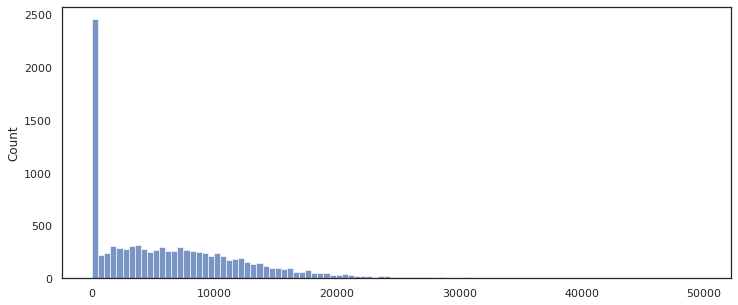

In [33]:
import seaborn as sns
sns.set_context('paper')
sns.set(style='white')
plt.figure(figsize=(12,5))
sns.histplot(label_areas, bins=100)
plt.show()

In [34]:
with h5py.File(FILE_PATH, "a") as f:
    label_areas_test = []
    for i in tqdm(range(f[TEST_SPLIT_LABEL_PATH].shape[0])):
        label_areas_test.append(f[TRAIN_SPLIT_LABEL_PATH][i].sum())

100%|██████████| 1260/1260 [00:00<00:00, 2750.89it/s]


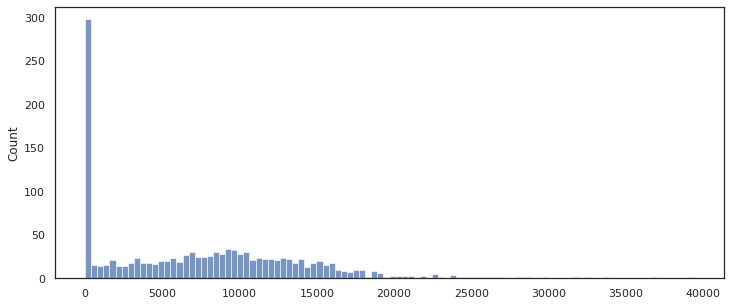

In [35]:
plt.figure(figsize=(12,5))
sns.histplot(label_areas_test, bins=100)
plt.show()

In [36]:
size = 256*256
label_areas_rate = np.array(label_areas) / size * 100

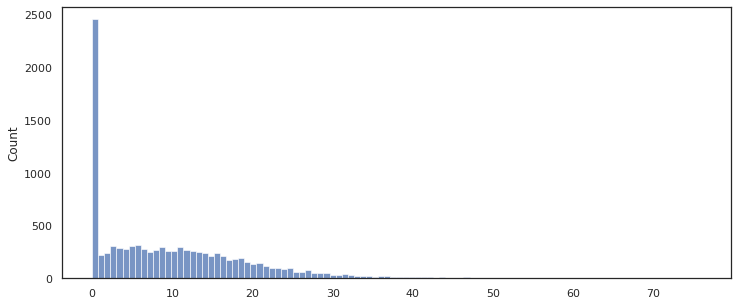

In [37]:
plt.figure(figsize=(12,5))
sns.histplot(label_areas_rate, bins=100)
plt.show()

#### 면적별 이미지 수

In [38]:
unique, counts = np.unique(label_areas, return_counts=True)
cnt_dict = dict(zip(unique.astype(np.uint8), counts))

In [39]:
_max = 256*256 + 1

In [40]:
label_areas_cnt = [cnt_dict[i] if i in cnt_dict else 0 for i in range(_max)]

In [54]:
def rate_under_lenght_threshold(hist, threshole):
    cnt = sum(hist[2:threshole+2])
    total = sum(hist)
    print(cnt)
    print(f'rate of label {threshole} or less in size of label : {(cnt / total) * 100}')

In [78]:
rate_under_lenght_threshold(label_areas_cnt, 5)
rate_under_lenght_threshold(label_areas_cnt, 10)
rate_under_lenght_threshold(label_areas_cnt, 15)
rate_under_lenght_threshold(label_areas_cnt, 20)
rate_under_lenght_threshold(label_areas_cnt, 25)
rate_under_lenght_threshold(label_areas_cnt, 30)
rate_under_lenght_threshold(label_areas_cnt, 40)
rate_under_lenght_threshold(label_areas_cnt, 50)
rate_under_lenght_threshold(label_areas_cnt, 60)
rate_under_lenght_threshold(label_areas_cnt, 70)
rate_under_lenght_threshold(label_areas_cnt, 80)
rate_under_lenght_threshold(label_areas_cnt, 256*256)

5
rate of label 5 or less in size of label : 1.9157088122605364
10
rate of label 10 or less in size of label : 3.8314176245210727
15
rate of label 15 or less in size of label : 5.747126436781609
20
rate of label 20 or less in size of label : 7.662835249042145
26
rate of label 25 or less in size of label : 9.961685823754788
31
rate of label 30 or less in size of label : 11.877394636015326
41
rate of label 40 or less in size of label : 15.708812260536398
51
rate of label 50 or less in size of label : 19.54022988505747
61
rate of label 60 or less in size of label : 23.371647509578544
71
rate of label 70 or less in size of label : 27.203065134099617
81
rate of label 80 or less in size of label : 31.03448275862069
258
rate of label 65536 or less in size of label : 98.85057471264368


In [100]:
np_label_areas = np.array(label_areas)
label_areas_under_30 = np_label_areas[np_label_areas == 0]

In [101]:
unique_under_30, counts_under_30 = np.unique(label_areas_under_30, return_counts=True)
unique_under_30 = unique_under_30.astype(np.uint8)
cnt_dict_under_30 = dict(zip(unique_under_30.astype(np.uint8), counts_under_30))

0.0

In [103]:
print(cnt_dict_under_30[0])

2199


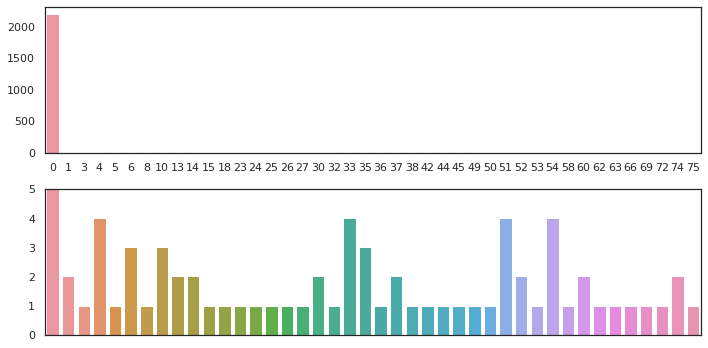

In [91]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 5))

#fig.axes.get_xaxis().set_visible(False)
#fig.axes.get_yaxis().set_visible(False)
sns.barplot(x=unique_under_30, y=counts_under_30, ax=ax1)
sns.barplot(x=unique_under_30, y=counts_under_30, ax=ax2)
plt.xticks([])
ax2.set(ylim=(0, 5))
plt.tight_layout()
plt.show()

In [104]:
img_idx = []
for i in range(25):
    tmp = np.where(np_label_areas == i)[0]
    if len(tmp):
        img_idx.append(tmp[0])
    else:
        img_idx.append(-1)
img_idx_dict = { k : v for k, v in enumerate(img_idx) if v > -1}

In [105]:
dict_with_area = {}
with h5py.File(FILE_PATH, "r") as f:
    label_dict_with_area = { k : f[TRAIN_SPLIT_LABEL_PATH][idx] for k, idx in img_idx_dict.items()}

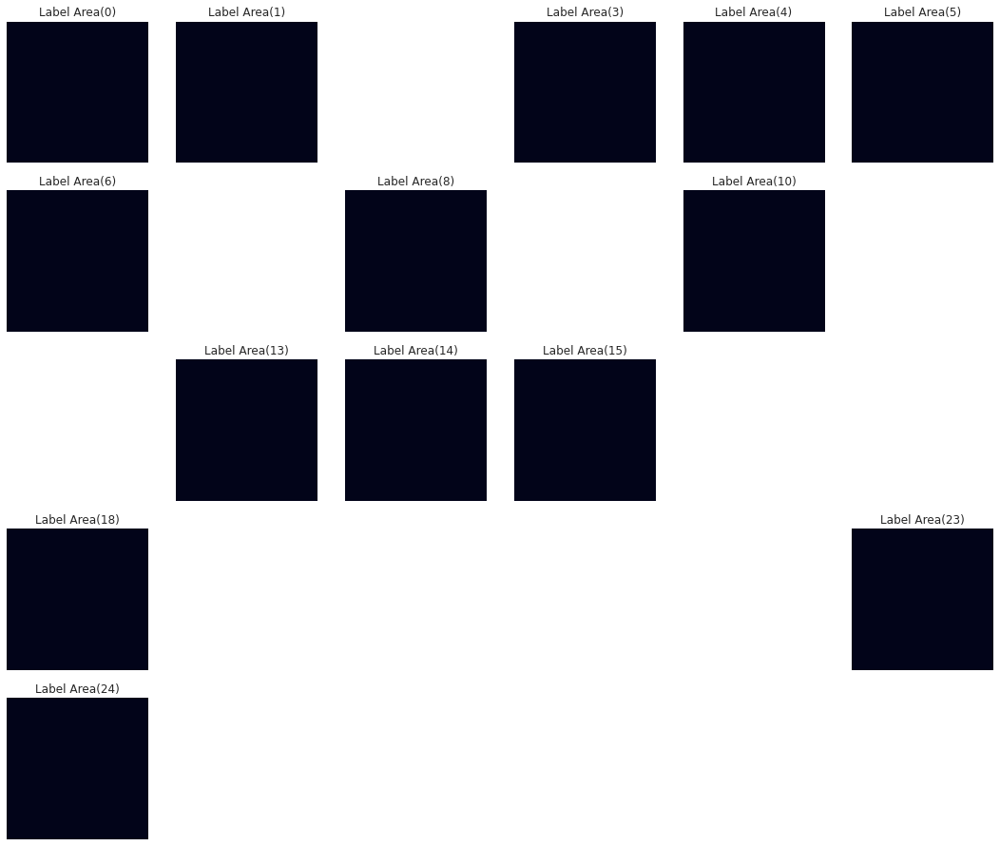

In [106]:
plt.figure(figsize=(15, 15))
for i, img in label_dict_with_area.items():
    plt.subplot(6, 6, i+1)
    plt.imshow(img)
    plt.title(f'Label Area({i})')
    plt.axis('off')
plt.tight_layout()
plt.show()

여기서부터 실행해주세요

In [32]:
def filtering_contain_zero_label(imgs, labels, threshold=1, img_size=256, saver=1):
    """ label을 조건에 맞게 필터링해주는 함수
    라벨에서 1이 threshold 초과인 것들만을 필터링하여 반환합니다.
    하지만, threshold 미만은 모든 데이터를 지우는 것은 데이터 학습의 효율을 떨어뜨릴 수 있으므로,
    이 과정에 확률을 넣어 (면적 차지 비율)% 확률로 threshold 미만의 데이터가 필터링 되지 않도록 한다.
    예외. 비율이 0인 데이터는 0.001% 확률로 필터링 되지 않는다.
    
    Args:
        imgs (list): 잘려진 이미지 목록, labels와 쌍을 이룬다.
        labels (list): 잘려진 라벨 목록, imgs와 쌍을 이룬다.
        threshold (float): 라벨에 포한된 1의 비율(%)이 threshold 이하인 것은 필터링되고 초과인 것들만 남게된다.

    Returns:
        filtered_imgs (list): 필터링된 이미지
        filtered_labels (list): 필터링된 라벨
    """
    rand = lambda x: np.random.choice([0, 1], 1, p=[1-(x/100), x/100])[0]
    rand_zero = lambda : np.random.choice([0, 1], 1, p=[0.999, 0.001])[0]

    label_areas = np.array([label.sum() for label in labels])
    rates = label_areas / (img_size * img_size) * 100
    filter_mask = filter_mask = [True if rate > threshold else 
    rand_zero() if rate == 0 else rand(rate) for rate in rates]
    
    filtered_imgs = [img for img, mask in zip(imgs, filter_mask) if mask]
    filtered_labels = [label for label, mask in zip(labels, filter_mask) if mask]
    return filtered_imgs, filtered_labels

In [33]:
import time
import datetime
# change the function for 4 channel
def split_filtering_save(FILE_PATH, BASE_DIR, IMG_PATH, LABEL_PATH, SPLIT_DIR, COLOR, pts, img_size=256, split_cnt=25, threshold=1):
    """ label을 조건에 맞게 필터링해주는 함수
    라벨에서 1이 threshold 초과인 것들만을 필터링하여 반환합니다.
    
    Args:
        imgs (list): 잘려진 이미지 목록, labels와 쌍을 이룬다.
        labels (list): 잘려진 라벨 목록, imgs와 쌍을 이룬다.
        threshold (float): 라벨에 포한된 1의 비율(%)이 threshold 이하인 것은 필터링되고 초과인 것들만 남게된다.

    Returns:
        filtered_imgs (list): 필터링된 이미지
        filtered_labels (list): 필터링된 라벨
    """
    start_time = time.time()
    with h5py.File(FILE_PATH, "a") as f:
        # create split dataset ex. FILE[train][split][img], FILE[train][split][label]
        size = f[IMG_PATH].shape[0] * split_cnt
        if 'split' in f[BASE_DIR].keys(): del f[SPLIT_DIR]
        f[BASE_DIR].create_group('split')
        f[BASE_DIR]['split'].create_dataset('img', (size, img_size, img_size, 4), np.uint8, maxshape=(size, img_size, img_size, 4))
        f[BASE_DIR]['split'].create_dataset('label', (size, img_size, img_size), np.float32, maxshape=(size, img_size, img_size))
        
        sub_idx = 0
        for i in tqdm(range(f[IMG_PATH].shape[0])):
            # split img with pts(left-top points)
            img = np.concatenate((f[IMG_PATH][i][:,:,:3],np.reshape(f[IMG_PATH][i][:,:,4], f[IMG_PATH][i][:,:,4].shape+(1,))),axis=2)
            sub_imgs = split_png(img, pts)
            
            # extract binary mask from label
            mask = (f[LABEL_PATH][i] == COLOR)
            mask = (mask[:,:,0] +  mask[:,:,1] +  mask[:,:,2]).astype(np.float32)
            
             # split mask with pts
            sub_labels = split_png(mask, pts)
            
            # filtering labels.
            # after this, the label ratio of less than threshold is filtered out.
            filtered_imgs, filtered_labels = filtering_contain_zero_label(sub_imgs, sub_labels, threshold=1, img_size=img_size)
            
            # save imgs and labels in split dataset
            filted_img_size = len(filtered_imgs)
            f[SPLIT_DIR]['img'][sub_idx:sub_idx+filted_img_size, ...] = filtered_imgs
            f[SPLIT_DIR]['label'][sub_idx:sub_idx+filted_img_size, ...] = filtered_labels
            sub_idx += filted_img_size
            
        # resize dataset
        f[BASE_DIR]['split']['img'].resize((sub_idx, img_size, img_size, 4))
        f[BASE_DIR]['split']['label'].resize((sub_idx, img_size, img_size))

In [120]:
print(pts)

[(0, 256, 0, 256), (0, 256, 192, 448), (0, 256, 384, 640), (0, 256, 576, 832), (0, 256, 768, 1024), (192, 448, 0, 256), (192, 448, 192, 448), (192, 448, 384, 640), (192, 448, 576, 832), (192, 448, 768, 1024), (384, 640, 0, 256), (384, 640, 192, 448), (384, 640, 384, 640), (384, 640, 576, 832), (384, 640, 768, 1024), (576, 832, 0, 256), (576, 832, 192, 448), (576, 832, 384, 640), (576, 832, 576, 832), (576, 832, 768, 1024), (768, 1024, 0, 256), (768, 1024, 192, 448), (768, 1024, 384, 640), (768, 1024, 576, 832), (768, 1024, 768, 1024)]


In [34]:
split_filtering_save(FILE_PATH, BASE_TARIN_DIR, TRAIN_IMG_PATH, TRAIN_LABEL_PATH,
                     TRAIN_SPLIT_DIR, COLOR_MAP[1], pts)

100%|██████████| 1024/1024 [03:44<00:00,  4.56it/s]


In [35]:
split_filtering_save(FILE_PATH, BASE_VAL_DIR, VAL_IMG_PATH, VAL_LABEL_PATH,
                     VAL_SPLIT_DIR, COLOR_MAP[1], pts)

100%|██████████| 120/120 [00:13<00:00,  9.19it/s]


In [36]:
split_and_save(FILE_PATH, BASE_TEST_DIR, TEST_IMG_PATH, TEST_LABEL_PATH,
               TEST_SPLIT_DIR, COLOR_MAP[1], pts)

100%|██████████| 126/126 [00:06<00:00, 18.29it/s]


In [69]:
print(TRAIN_SPLIT_LABEL_PATH)
with h5py.File(FILE_PATH, "r") as f:
    img_size = f[TRAIN_SPLIT_LABEL_PATH].shape[0]
    print(img_size)

/train/split/label
19205


In [127]:
with h5py.File(FILE_PATH, "r") as f:
    img_size = f[TRAIN_SPLIT_LABEL_PATH].shape[0]
    building_areas = [f[TRAIN_SPLIT_LABEL_PATH][i].sum() for i in range(img_size)]

plt.figure(figsize=(12,5))
sns.histplot(building_areas, bins=100)
plt.show()

KeyboardInterrupt: 

In [114]:
def show_area_distributaion(FILE_PATH, DIR_PATH):
    with h5py.File(FILE_PATH, "r") as f:
        img_size = f[DIR_PATH].shape[0]
        building_areas = np.sum(f[DIR_PATH], axis=1)
        building_areas = np.sum(building_areas, axis=1)

    plt.figure(figsize=(12,5))
    sns.histplot(building_areas, bins=100)
    plt.show()

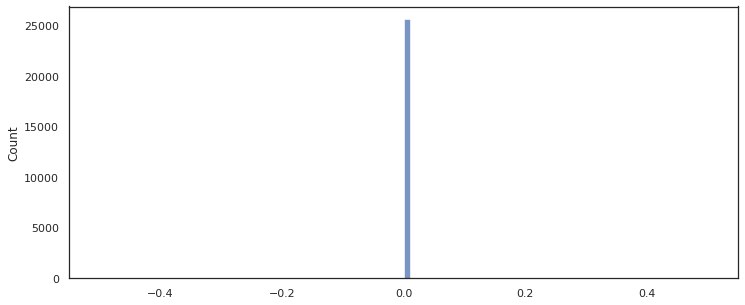

In [115]:
show_area_distributaion(FILE_PATH, TRAIN_SPLIT_LABEL_PATH)

In [48]:
train_datagenerator_4, valid_datagenerator_4 = get_datagenerator(BATCH_SIZE=BATCH_SIZE)
optim_4 = keras.optimizers.Adam(lr)

In [49]:
model_11_4, callbacks_4 = get_model('E11-4',
                                 optim_4,
                                  train_datagenerator_4, 
                                  valid_datagenerator_4,
                                  './trained_model/E11/E11_4_best_model.h5',
                                  patience=10)

In [50]:
model_11_4.load_weights('./trained_model/E11/E11_4_best_model.h5')

In [51]:
preprocess_input = sm.get_preprocessing('efficientnetb3')
test_datagenerator_4 = SatelliteGenerator(
    FILE_PATH,
    TEST_SPLIT_IMG_PATH, 
    TEST_SPLIT_LABEL_PATH, 
    batch_size=BATCH_SIZE,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
    is_train=False
)
val_metrix = model_11_4.evaluate(valid_datagenerator_4)
test_metrix = model_11_4.evaluate(test_datagenerator_4)

394/394 [==============================] - 18s 46ms/step - loss: 0.4417 - iou_score: 0.5146 - f1-score: 0.6500


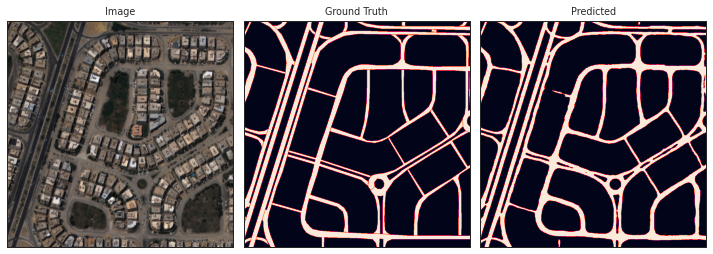

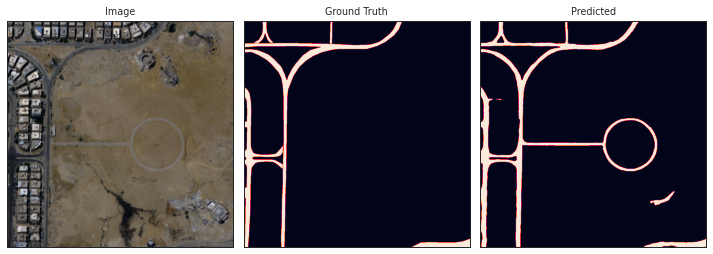

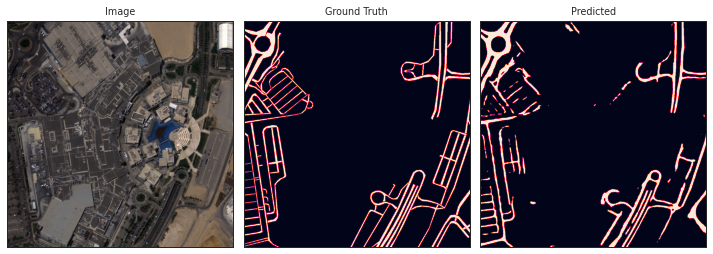

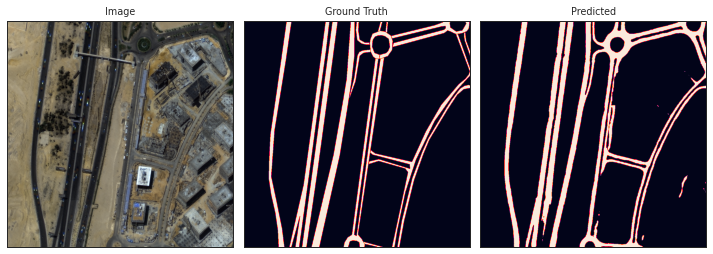

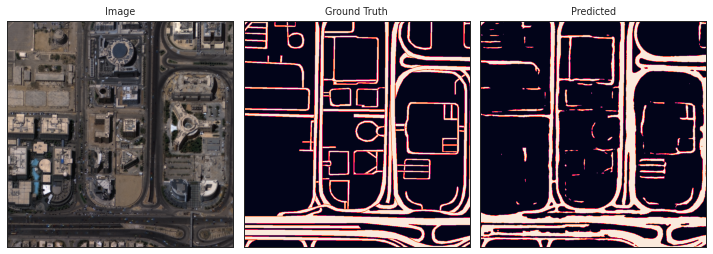

In [52]:
BACKBONE = 'efficientnetb3'
show_inference_4ch(model_11_4)

### E11-6

In [128]:
lr = 1e-3
BATCH_SIZE = 8
EPOCHS=100
optim = keras.optimizers.Adam(lr)
train_datagenerator_6, valid_datagenerator_6 = get_datagenerator(BATCH_SIZE=BATCH_SIZE)


In [129]:
model_11_6, callbacks = get_model('E11-6',
                                 optim,
                                  train_datagenerator_6, 
                                  valid_datagenerator_6,
                                  './trained_model/E11/E11_6_best_model.h5',
                                  patience=5)

/home/aiffel-dj15/anaconda3/envs/aiffel/lib/python3.7/site-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


In [130]:
start_time = time.time()

history_11_6 = model_11_6.fit(
    train_datagenerator_6, 
    steps_per_epoch=len(train_datagenerator_6), 
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_datagenerator_6, 
    validation_steps=len(valid_datagenerator_6))

sec = time.time()-start_time
times = str(datetime.timedelta(seconds=sec)).split(".")
times = times[0]
print(f'WorkingTime : {times}')

Epoch 1/100
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 

In [131]:
model_11_6.load_weights('./trained_model/E11/E11_6_best_model.h5')

In [133]:
preprocess_input = sm.get_preprocessing('efficientnetb3')
test_datagenerator_6 = SatelliteGenerator(
    FILE_PATH,
    TEST_SPLIT_IMG_PATH, 
    TEST_SPLIT_LABEL_PATH, 
    batch_size=BATCH_SIZE,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
    is_train=False
)
val_metrix = model_11_6.evaluate(valid_datagenerator_6)
test_metrix = model_11_6.evaluate(test_datagenerator_6)

394/394 [==============================] - 43s 109ms/step - loss: 0.4576 - iou_score: 0.4955 - f1-score: 0.6320


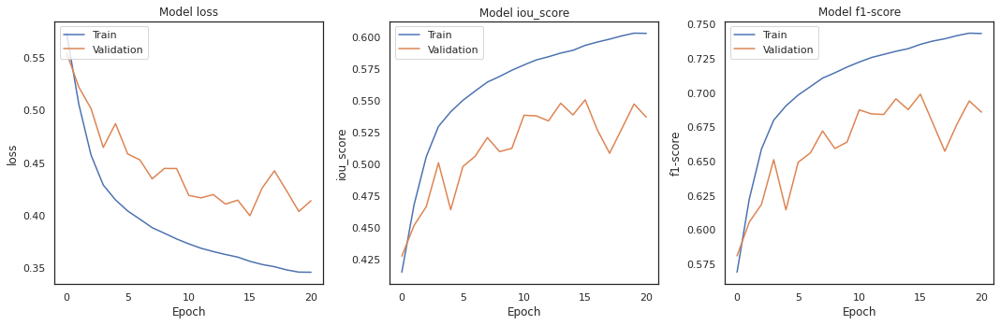

In [134]:
show_history_plot(history_11_6.history)

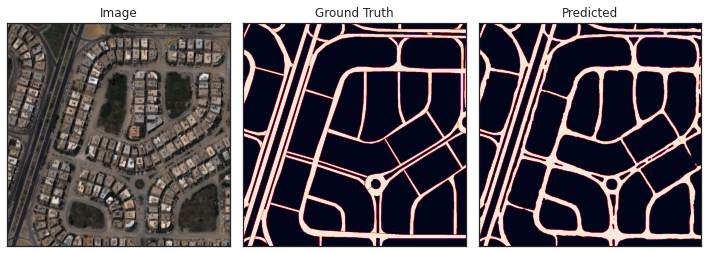

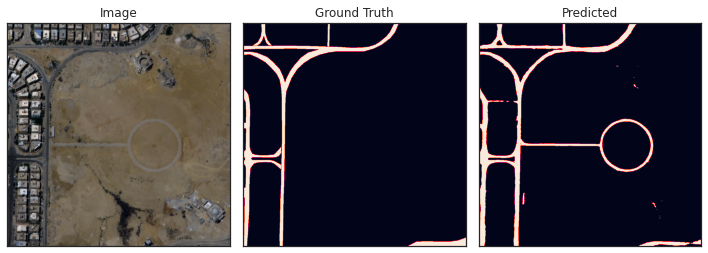

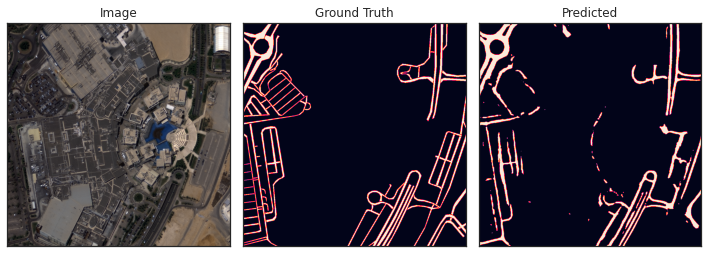

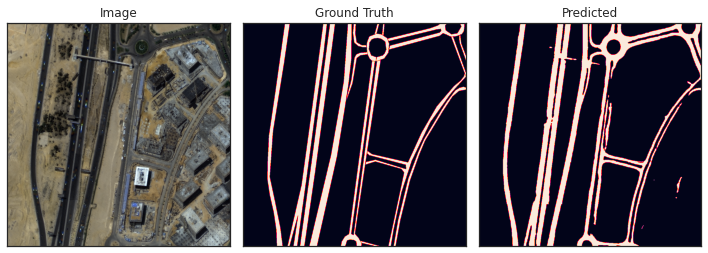

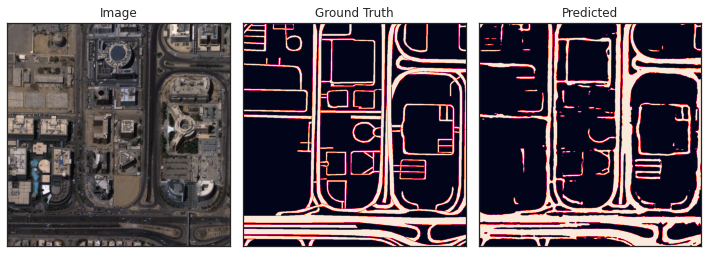

In [135]:
BACKBONE = 'efficientnetb3'
show_inference_4ch(model_11_6)

In [37]:
lr = 1e-3
BATCH_SIZE = 8
EPOCHS=100
optim = keras.optimizers.Adam(lr)
train_datagenerator_7, valid_datagenerator_7 = get_datagenerator(BATCH_SIZE=BATCH_SIZE)

In [38]:
model_11_7, callbacks = get_model('E11-7',
                                 optim,
                                  train_datagenerator_7, 
                                  valid_datagenerator_7,
                                  './trained_model/E11/E11_7_best_model.h5',
                                  patience=10)

/home/aiffel-dj15/anaconda3/envs/aiffel/lib/python3.7/site-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


In [39]:
model_11_7.load_weights('./trained_model/E11/E11_7_best_model.h5')

In [40]:
start_time = time.time()

history_11_7 = model_11_7.fit(
    train_datagenerator_7, 
    steps_per_epoch=len(train_datagenerator_7), 
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_datagenerator_7, 
    validation_steps=len(valid_datagenerator_7))

sec = time.time()-start_time
times = str(datetime.timedelta(seconds=sec)).split(".")
times = times[0]
print(f'WorkingTime : {times}')

Epoch 1/100
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 

In [41]:
preprocess_input = sm.get_preprocessing('efficientnetb3')
test_datagenerator_7 = SatelliteGenerator(
    FILE_PATH,
    TEST_SPLIT_IMG_PATH, 
    TEST_SPLIT_LABEL_PATH, 
    batch_size=BATCH_SIZE,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
    is_train=False
)
val_metrix = model_11_7.evaluate(valid_datagenerator_7)
test_metrix = model_11_7.evaluate(test_datagenerator_7)

394/394 [==============================] - 44s 112ms/step - loss: 0.4646 - iou_score: 0.4999 - f1-score: 0.6349


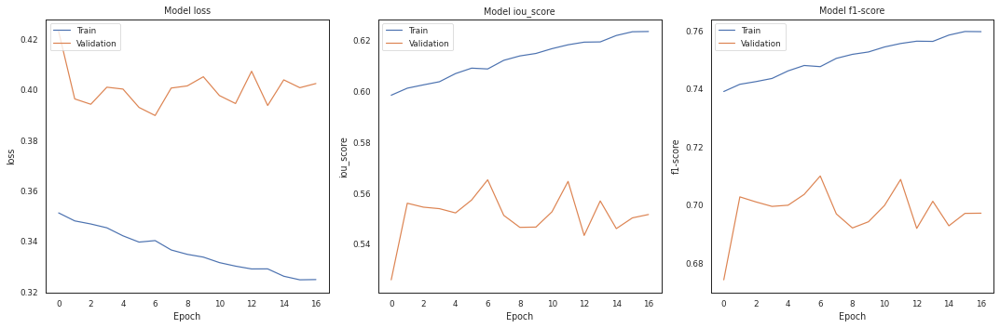

In [42]:
show_history_plot(history_11_7.history)

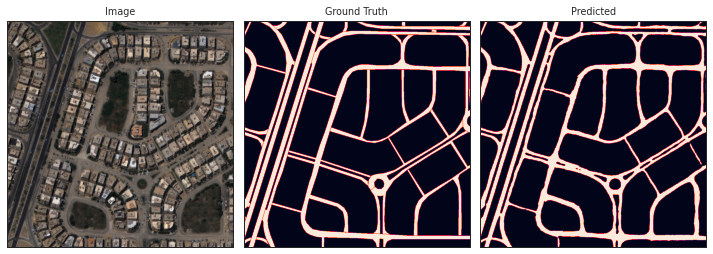

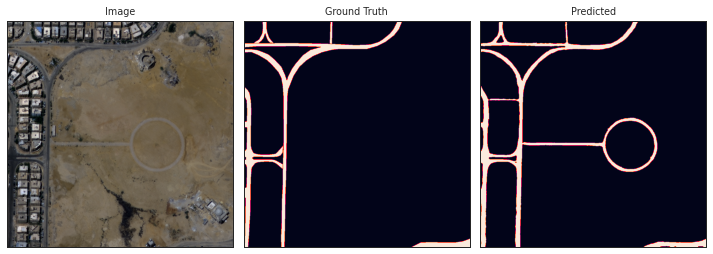

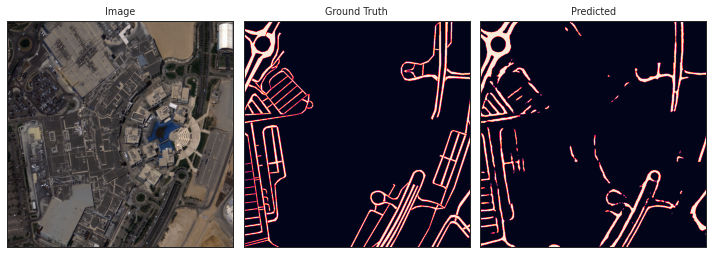

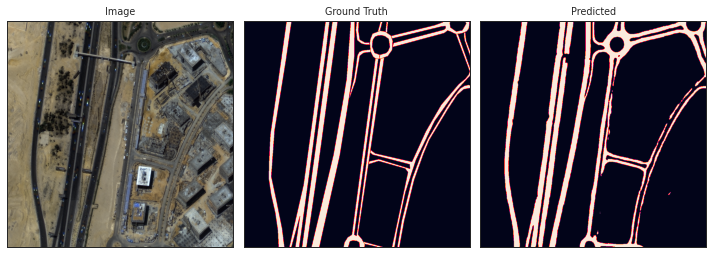

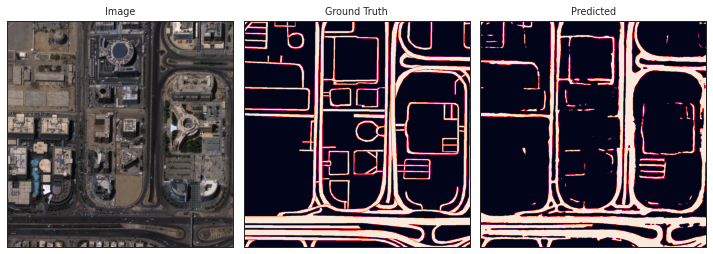

In [43]:
BACKBONE = 'efficientnetb3'
show_inference_4ch(model_11_7)

# E11-5 : 30 이하인 데이터 완전 제외하지 말고 섞자

#### 과정
1. 

In [ ]:
lr = 1e-3
BATCH_SIZE = 8
EPOCHS=100
optim = keras.optimizers.Adam(lr)
train_datagenerator_5, valid_datagenerator_5 = get_datagenerator(BATCH_SIZE=BATCH_SIZE)

In [ ]:
model_11_5, callbacks = get_model('E11-5',
                                 optim,
                                  train_datagenerator_5, 
                                  valid_datagenerator_5,
                                  './trained_model/E11/E11_5_best_model.h5',
                                  patience=5)

In [ ]:
start_time = time.time()

history_11_5 = model_11_5.fit(
    train_datagenerator_5, 
    steps_per_epoch=len(train_datagenerator_5), 
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_datagenerator_5, 
    validation_steps=len(valid_datagenerator_5))

sec = time.time()-start_time
times = str(datetime.timedelta(seconds=sec)).split(".")
times = times[0]
print(f'WorkingTime : {times}')

In [ ]:
model_11_5.load_weights('./trained_model/E11/E11_5_best_model.h5')

In [ ]:
preprocess_input = sm.get_preprocessing('efficientnetb3')
test_datagenerator_5 = SatelliteGenerator(
    FILE_PATH,
    TEST_SPLIT_IMG_PATH, 
    TEST_SPLIT_LABEL_PATH, 
    batch_size=BATCH_SIZE,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
    is_train=False
)
val_metrix = model_11_5.evaluate(valid_datagenerator_5)
test_metrix = model_11_5.evaluate(test_datagenerator_5)

In [ ]:
show_history_plot(history_11_5.history)

In [ ]:
BACKBONE = 'efficientnetb3'
show_inference_4ch(model_11_5)

## additional information
---

### 1. learning rate
- ref : https://github.com/peteryuX/pcdarts-tf2/blob/4ecf2224cd414586d988c2d3d4316af0d518e8e8/modules/lr_scheduler.py
- ref : https://velog.io/@changdaeoh/learningrateschedule

In [ ]:
import tensorflow as tf
import matplotlib as mpl
from matplotlib import pyplot as plt
import matplotlib.ticker as mtick
mpl.style.use('default')
import seaborn
seaborn.set(style='whitegrid')
seaborn.set_context('paper')

def MultiStepLR(initial_learning_rate, lr_steps, lr_rate, name='MultiStepLR'):
    """Multi-steps learning rate scheduler."""
    lr_steps_value = [initial_learning_rate]
    for _ in range(len(lr_steps)):
        lr_steps_value.append(lr_steps_value[-1] * lr_rate)
    return tf.keras.optimizers.schedules.PiecewiseConstantDecay(
        boundaries=lr_steps, values=lr_steps_value)


def CosineAnnealingLR_Restart(initial_learning_rate, t_period, lr_min=0.):
    """Cosine annealing learning rate scheduler with restart."""
    return tf.keras.experimental.CosineDecayRestarts(
        initial_learning_rate=initial_learning_rate,
        first_decay_steps=t_period, t_mul=1.0, m_mul=1.0,
        alpha=lr_min / initial_learning_rate)


def CosineAnnealingLR(initial_learning_rate, t_period, lr_min=0.):
    """Cosine annealing learning rate scheduler with restart."""
    return tf.keras.experimental.CosineDecay(
        initial_learning_rate=initial_learning_rate,
        decay_steps=t_period, alpha=lr_min / initial_learning_rate)


def show_learning_rate(lr_scheduler, title="Title"):
    N_iter = 10000
    step_list = list(range(0, N_iter, 10))
    lr_list = []
    for i in step_list:
        current_lr = lr_scheduler(i).numpy()
        lr_list.append(current_lr)

    plt.figure(1)
    plt.subplot(111)
    plt.ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
    plt.title(title, fontsize=16, color='k')
    plt.plot(step_list, lr_list, linewidth=1.5, label='learning rate scheme')
    legend = plt.legend(loc='upper right', shadow=False)
    ax = plt.gca()
    labels = ax.get_xticks().tolist()
    for k, v in enumerate(labels):
        labels[k] = str(int(v / 1000)) + 'K'
    ax.set_xticklabels(labels)
    ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1e'))

    ax.set_ylabel('Learning rate')
    ax.set_xlabel('Iteration')
    fig = plt.gcf()
    plt.show()

In [ ]:
show_learning_rate(MultiStepLR(1e-4, [500, 1000, 2000, 3000], 0.5), 'MultiStepLR')
show_learning_rate(CosineAnnealingLR_Restart(2e-4, 2500, 1e-7), 'CosineAnnealingLR_Restart')
show_learning_rate(CosineAnnealingLR(0.025, 10000, 0), 'CosineAnnealingLR')